The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg compressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data
 

# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [1]:
!pip install kaggle

You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


In [1]:
!pwd


/root/shared/Project_AppliedML/I526_AML_Student-master/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [2]:
!pwd

/root/shared/Project_AppliedML/I526_AML_Student-master/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [3]:
!ls -l  ~/.kaggle/kaggle.json

-rw------- 1 root root 69 Dec 13 04:09 /root/.kaggle/kaggle.json


In [4]:
!mkdir ~/.kaggle
!cp /root/shared/Project_AppliedML//I526_AML_Student-master/kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [5]:
! kaggle competitions files home-credit-default-risk

name                                 size  creationDate         
----------------------------------  -----  -------------------  
bureau_balance.csv                  358MB  2019-12-11 02:55:35  
application_train.csv               158MB  2019-12-11 02:55:35  
POS_CASH_balance.csv                375MB  2019-12-11 02:55:35  
application_test.csv                 25MB  2019-12-11 02:55:35  
installments_payments.csv           690MB  2019-12-11 02:55:35  
credit_card_balance.csv             405MB  2019-12-11 02:55:35  
bureau.csv                          162MB  2019-12-11 02:55:35  
sample_submission.csv               524KB  2019-12-11 02:55:35  
previous_application.csv            386MB  2019-12-11 02:55:35  
HomeCredit_columns_description.csv   37KB  2019-12-11 02:55:35  


# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview

The `HomeCredit_columns_description.csv` acts as a data dictioanry.

There are 7 different sources of data:

* __application_train/application_test (307k rows, and 48k rows):__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau (1.7 Million rows):__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance (27 Million rows):__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application (1.6 Million rows):__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE (10 Million rows):__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment (13.6 Million rows):__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.


### Table sizes
```python
name                       [  rows cols]     MegaBytes         
-----------------------  ------------------  -------
application_train       : [  307,511, 122]:   158MB
application_test        : [   48,744, 121]:   25MB
bureau                  : [ 1,716,428, 17]    162MB
bureau_balance          : [ 27,299,925, 3]:   358MB
credit_card_balance     : [  3,840,312, 23]   405MB
installments_payments   : [ 13,605,401, 8]    690MB
previous_application    : [  1,670,214, 37]   386MB
POS_CASH_balance        : [ 10,001,358, 8]    375MB
```




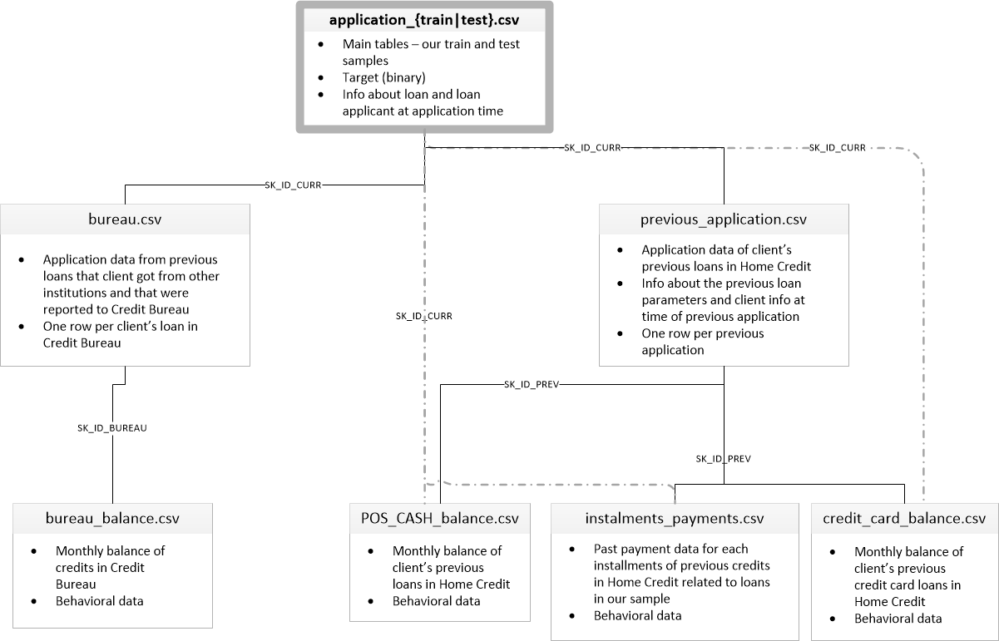

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


In [6]:
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
#DATA_DIR = os.path.join('./ddddd/')
!mkdir DATA_DIR

mkdir: cannot create directory ‘DATA_DIR’: File exists


In [7]:
!ls -l DATA_DIR

total 2621364
-rwxrwxrwx 1 root root     37383 Dec 11  2019 HomeCredit_columns_description.csv
-rwxrwxrwx 1 root root 392703158 Nov 26 18:35 POS_CASH_balance.csv
-rwxrwxrwx 1 root root  26567651 Nov 26 18:34 application_test.csv
-rwxrwxrwx 1 root root 166133370 Nov 26 18:34 application_train.csv
-rwxrwxrwx 1 root root 170016717 Nov 26 18:34 bureau.csv
-rwxrwxrwx 1 root root 375592889 Nov 26 18:34 bureau_balance.csv
-rwxrwxrwx 1 root root 424582605 Nov 26 18:35 credit_card_balance.csv
-rwxrwxrwx 1 root root 723118349 Nov 26 18:35 installments_payments.csv
-rwxrwxrwx 1 root root 404973293 Nov 26 18:36 previous_application.csv
-rwxrwxrwx 1 root root    536202 Dec 11  2019 sample_submission.csv


In [8]:
! kaggle competitions download home-credit-default-risk -p $DATA_DIR

home-credit-default-risk.zip: Skipping, found more recently modified local copy (use --force to force download)


In [9]:
!pwd 

/root/shared/Project_AppliedML/I526_AML_Student-master/Assignments/Unit-Project-Home-Credit-Default-Risk/Phase2


In [10]:
!ls -l $DATA_DIR

total 3326068
-rwxrwxrwx 1 root root     37383 Dec 11  2019 HomeCredit_columns_description.csv
-rwxrwxrwx 1 root root 392703158 Nov 26 18:35 POS_CASH_balance.csv
-rwxrwxrwx 1 root root  26567651 Nov 26 18:34 application_test.csv
-rwxrwxrwx 1 root root 166133370 Nov 26 18:34 application_train.csv
-rwxrwxrwx 1 root root 170016717 Nov 26 18:34 bureau.csv
-rwxrwxrwx 1 root root 375592889 Nov 26 18:34 bureau_balance.csv
-rwxrwxrwx 1 root root 424582605 Nov 26 18:35 credit_card_balance.csv
-rw-r--r-- 1 root root 721616255 Nov 26 17:34 home-credit-default-risk.zip
-rwxrwxrwx 1 root root 723118349 Nov 26 18:35 installments_payments.csv
-rwxrwxrwx 1 root root 404973293 Nov 26 18:36 previous_application.csv
-rwxrwxrwx 1 root root    536202 Dec 11  2019 sample_submission.csv


In [11]:
#!rm -r  DATA_DIR

### Imports

In [12]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

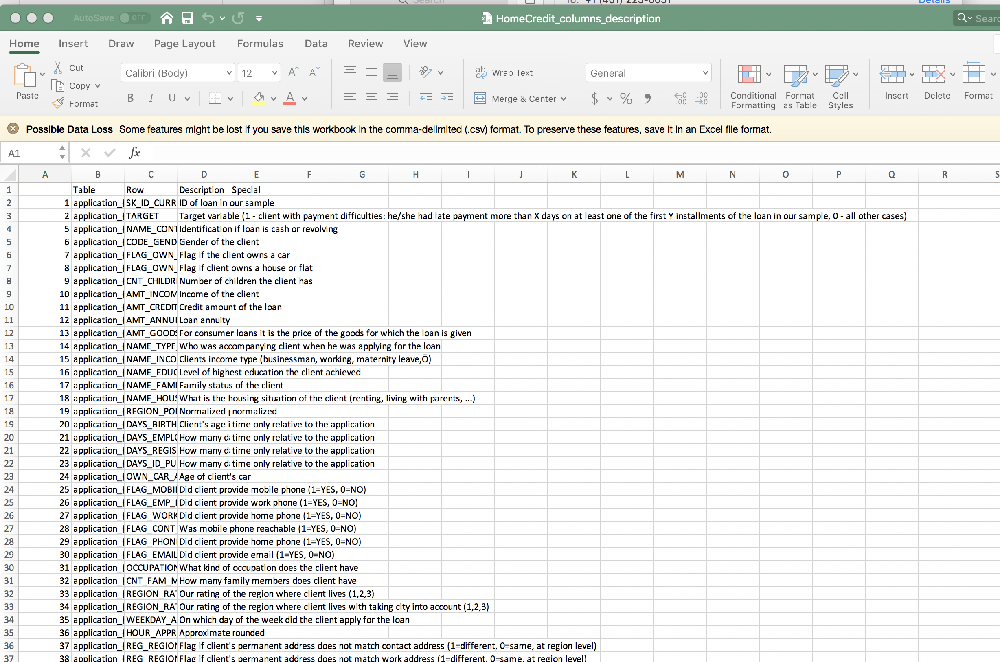

### Application train

In [13]:
ls -l ../../../Data/home-credit-default-risk/application_train.csv

-rwxrwxrwx 1 root root 166133370 Nov 26 18:34 ../../../Data/home-credit-default-risk/application_train.csv*


In [14]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
ds_name = 'application_train'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


(307511, 122)

In [15]:
DATA_DIR

'../../../Data/home-credit-default-risk'

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [16]:
ds_name = 'application_test'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
ds_name = 'bureau'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [17]:
ds_name = 'previous_application'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
ds_name = 'installments_payments'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

The application dataset has the most information about the client: Gender, income, family status, education ...

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [21]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)


application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


bureau_balance: shape is (27299925, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_C

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


CPU times: user 24.7 s, sys: 5.61 s, total: 30.3 s
Wall time: 31.8 s


In [15]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')


dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset previous_application    : [  1,670,214, 37]


# Exploratory Data Analysis

Here, we are exploring all the data tables by passing it through various built-in functions:
1. info(dataset)
2. shape(dataset)
3. head(dataset)
4. tail(dataset)
5. describe(dataset)
6. Numerical features of each dataset using describe()
7. Categorical features of each dataset using describe()
8. All features of a dataset using describe()
6. Count of each data type present in dataset
7. The value counts in dataset

# 3.1 List of Built-in functions created for Data Analysis

In [16]:
def info(dataset):
    print("")
    print("The Information of ",dataset + " is given below:")
    return(datasets[dataset].info())

In [17]:
def head(dataset):
    print("")
    print("The head of :", dataset + " is given below:")
    return(display(datasets[dataset].head()))

In [24]:
def tail(dataset):
    print("")
    print("The tail of :", dataset + " is given below:")
    return(display(datasets[dataset].tail()))

In [25]:
def shape(dataset):
    print("")
    print("The shape of :", dataset + " is given below:")
    return(display(datasets[dataset].shape))

In [26]:
def numerical_feat(dataset):
    print("")
    print("Below are the numerical features of :", dataset)
    return(display(datasets[dataset].describe(include = None)))

In [27]:
def categorical_feat(dataset):
    print("")
    print("Below are the categorical features of :", dataset)
    return(display(datasets[dataset].describe(include = 'object')))

In [28]:
def features(dataset):
    print("")
    print("Below are the total described features of :", dataset)
    return(display(datasets[dataset].describe(include = 'all')))

In [29]:
def describe(dataset):
    print("")
    print("The decription of :", dataset + " is given below:")
    return(display(datasets[dataset].describe()))

In [30]:
def datatype_count(dataset):
    print("")
    print("The datatype counts of :", dataset + " is given below:")
    return(pd.value_counts(datasets[dataset].dtypes))

In [31]:
def value_counts(dataset):
    print("")
    print("The value count of :", dataset + " is given below:")
    return(display(datasets[dataset].value_counts))
    

# EDA - Built-in functions utilized in each dataset

## Application Test

In [21]:
info("application_test")


The Information of  application_test is given below:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB


In [22]:
head("application_test")


The head of : application_test is given below:


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
tail("application_test")


The tail of : application_test is given below:


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
48743,456250,Cash loans,F,Y,N,0,135000.0,312768.0,24709.5,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0


In [35]:
shape("application_test")


The shape of : application_test is given below:


(48744, 121)

In [36]:
numerical_feat("application_test")


Below are the numerical features of : application_test


,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [37]:
categorical_feat("application_test")


Below are the categorical features of : application_test


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,48744,48744,48744,48744,47833,48744,48744,48744,48744,33139,48744,48744,15947,25125,24851,26535
unique,2,2,2,2,7,7,5,5,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,48305,32678,32311,33658,39727,24533,33988,32283,43645,8655,9751,10840,12124,24659,11269,26179


In [38]:
features("application_test")


Below are the total described features of : application_test


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744,48744,48744,48744,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
unique,NaN,2,2,2,2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,48305,32678,32311,33658,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,277796.676350,NaN,NaN,NaN,NaN,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,NaN,NaN,NaN,NaN,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,NaN,NaN,NaN,NaN,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,NaN,NaN,NaN,NaN,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,NaN,NaN,NaN,NaN,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000


In [39]:
describe("application_test")


The decription of : application_test is given below:


,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [40]:
datatype_count("application_test")


The datatype counts of : application_test is given below:


float64    65
int64      40
object     16
dtype: int64

In [41]:
value_counts("application_test")


The value count of : application_test is given below:


<bound method DataFrame.value_counts of        SK_ID_CURR NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR FLAG_OWN_REALTY  \
0          100001         Cash loans           F            N               Y   
1          100005         Cash loans           M            N               Y   
2          100013         Cash loans           M            Y               Y   
3          100028         Cash loans           F            N               Y   
4          100038         Cash loans           M            Y               N   
...           ...                ...         ...          ...             ...   
48739      456221         Cash loans           F            N               Y   
48740      456222         Cash loans           F            N               N   
48741      456223         Cash loans           F            Y               Y   
48742      456224         Cash loans           M            N               N   
48743      456250         Cash loans           F            Y        

## Application Train

In [23]:
info("application_train")


The Information of  application_train is given below:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [24]:
head("application_train")


The head of : application_train is given below:


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [44]:
tail("application_train")


The tail of : application_train is given below:


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
307510,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,0,0,0,0,0.0,0.0,0.0,2.0,0.0,1.0


In [45]:
shape("application_train")


The shape of : application_train is given below:


(307511, 122)

In [46]:
numerical_feat("application_train")


Below are the numerical features of : application_train


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [47]:
categorical_feat("application_train")


Below are the categorical features of : application_train


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


In [48]:
features("application_train")


Below are the total described features of : application_train


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687979e+05,5.990260e+05,27108.573909,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,2.371231e+05,4.024908e+05,14493.737315,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,2.565000e+04,4.500000e+04,1615.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.700000e+05,16524.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.471500e+05,5.135310e+05,24903.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,NaN,NaN,NaN,NaN,1.000000,2.025000e+05,8.086500e+05,34596.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000


In [49]:
describe("application_train")


The decription of : application_train is given below:


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [50]:
datatype_count("application_train")


The datatype counts of : application_train is given below:


float64    65
int64      41
object     16
dtype: int64

In [51]:
value_counts("application_train")


The value count of : application_train is given below:


<bound method DataFrame.value_counts of         SK_ID_CURR  TARGET NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR  \
0           100002       1         Cash loans           M            N   
1           100003       0         Cash loans           F            N   
2           100004       0    Revolving loans           M            Y   
3           100006       0         Cash loans           F            N   
4           100007       0         Cash loans           M            N   
...            ...     ...                ...         ...          ...   
307506      456251       0         Cash loans           M            N   
307507      456252       0         Cash loans           F            N   
307508      456253       0         Cash loans           F            N   
307509      456254       1         Cash loans           F            N   
307510      456255       0         Cash loans           F            N   

       FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  \
0

## Bureau 

In [52]:
info("bureau")


The Information of  bureau is given below:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


In [53]:
head("bureau")


The head of : bureau is given below:


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [54]:
tail("bureau")


The tail of : bureau is given below:


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN
1716427,246829,5057778,Closed,currency 1,-463,0,NaN,-387.0,NaN,0,22500.00,0.0,NaN,0.0,Microloan,-387,NaN


In [55]:
shape("bureau")


The shape of : bureau is given below:


(1716428, 17)

In [56]:
numerical_feat("bureau")


Below are the numerical features of : bureau


,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


In [57]:
categorical_feat("bureau")


Below are the categorical features of : bureau


,CREDIT_ACTIVE,CREDIT_CURRENCY,CREDIT_TYPE
count,1716428,1716428,1716428
unique,4,4,15
top,Closed,currency 1,Consumer credit
freq,1079273,1715020,1251615


In [58]:
features("bureau")


Below are the total described features of : bureau


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1716428,1716428,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1716428,1.716428e+06,4.896370e+05
unique,NaN,NaN,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,NaN,NaN,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,NaN,NaN,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,2.782149e+05,5.924434e+06,NaN,NaN,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,NaN,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,NaN,NaN,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,NaN,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,NaN,NaN,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,NaN,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,NaN,NaN,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,NaN,NaN,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,NaN,NaN,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,NaN,-3.300000e+01,1.350000e+04


In [59]:
describe("bureau")


The decription of : bureau is given below:


,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


In [60]:
datatype_count("bureau")


The datatype counts of : bureau is given below:


float64    8
int64      6
object     3
dtype: int64

In [61]:
value_counts("bureau")


The value count of : bureau is given below:


<bound method DataFrame.value_counts of          SK_ID_CURR  SK_ID_BUREAU CREDIT_ACTIVE CREDIT_CURRENCY  DAYS_CREDIT  \
0            215354       5714462        Closed      currency 1         -497   
1            215354       5714463        Active      currency 1         -208   
2            215354       5714464        Active      currency 1         -203   
3            215354       5714465        Active      currency 1         -203   
4            215354       5714466        Active      currency 1         -629   
...             ...           ...           ...             ...          ...   
1716423      259355       5057750        Active      currency 1          -44   
1716424      100044       5057754        Closed      currency 1        -2648   
1716425      100044       5057762        Closed      currency 1        -1809   
1716426      246829       5057770        Closed      currency 1        -1878   
1716427      246829       5057778        Closed      currency 1         -463   


# Missing Value Analysis and Plots to visualize the missing values

In [62]:
def Missing_Values(dataset):
    print("")
    print("These are the missing values of the following", dataset)
    percent = (datasets[dataset].isnull().sum()/datasets[dataset].isnull().count()*100).sort_values(ascending = False).round(2)
    sum_missing = datasets[dataset].isna().sum().sort_values(ascending = False)
    missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
    return(display(missing_application_train_data.head(20)))

In [63]:
Missing_Values("application_test")


These are the missing values of the following application_test


,Percent,Train Missing Count
COMMONAREA_AVG,68.72,33495
COMMONAREA_MODE,68.72,33495
COMMONAREA_MEDI,68.72,33495
NONLIVINGAPARTMENTS_AVG,68.41,33347
NONLIVINGAPARTMENTS_MODE,68.41,33347
NONLIVINGAPARTMENTS_MEDI,68.41,33347
FONDKAPREMONT_MODE,67.28,32797
LIVINGAPARTMENTS_AVG,67.25,32780
LIVINGAPARTMENTS_MODE,67.25,32780
LIVINGAPARTMENTS_MEDI,67.25,32780


In [64]:
Missing_Values("bureau")


These are the missing values of the following bureau


,Percent,Train Missing Count
AMT_ANNUITY,71.47,1226791
AMT_CREDIT_MAX_OVERDUE,65.51,1124488
DAYS_ENDDATE_FACT,36.92,633653
AMT_CREDIT_SUM_LIMIT,34.48,591780
AMT_CREDIT_SUM_DEBT,15.01,257669
DAYS_CREDIT_ENDDATE,6.15,105553
AMT_CREDIT_SUM,0.00,13
CREDIT_ACTIVE,0.00,0
CREDIT_CURRENCY,0.00,0
DAYS_CREDIT,0.00,0


In [65]:
print(datasets["application_test"].isnull())

       SK_ID_CURR  NAME_CONTRACT_TYPE  CODE_GENDER  FLAG_OWN_CAR  \
0           False               False        False         False   
1           False               False        False         False   
2           False               False        False         False   
3           False               False        False         False   
4           False               False        False         False   
...           ...                 ...          ...           ...   
48739       False               False        False         False   
48740       False               False        False         False   
48741       False               False        False         False   
48742       False               False        False         False   
48743       False               False        False         False   

       FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  \
0                False         False             False       False   
1                False         False       

In [66]:
import seaborn as sns
import matplotlib.pyplot as plt

In [67]:
def Missing_Plot(dataset):
    plt.figure(figsize=(210,50))
    sns.displot(
    data=datasets[dataset].iloc[: ,20 :60].isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=3
    ).set(title='Missing Values Plot')


<Figure size 15120x3600 with 0 Axes>

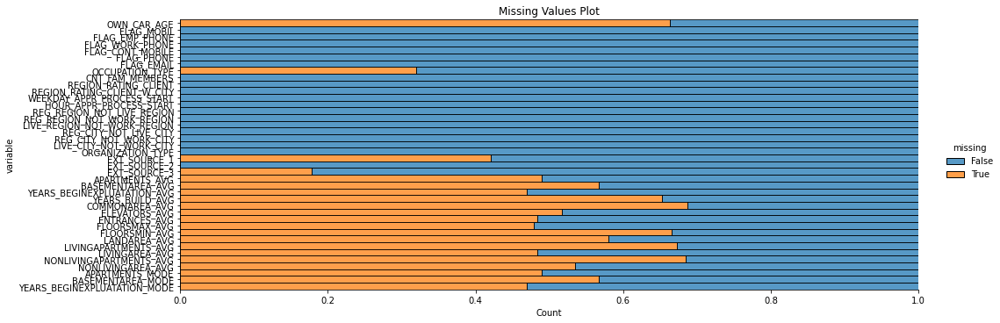

In [68]:
Missing_Plot("application_test")

In [69]:
def Plot(dataset):
    plt.figure(figsize=(10,6))
    sns.heatmap(datasets[dataset].iloc[: ,20 :60].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

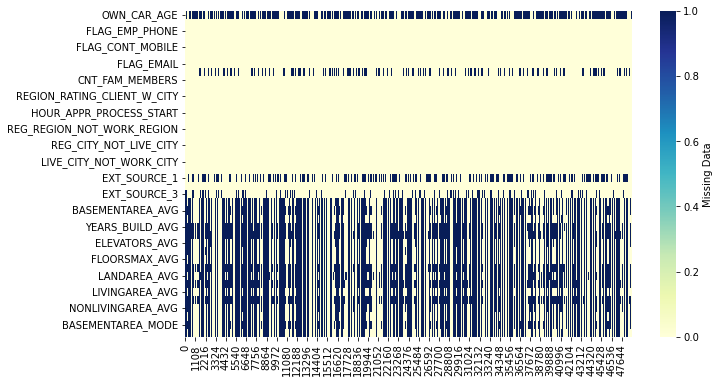

In [70]:
Plot("application_test")

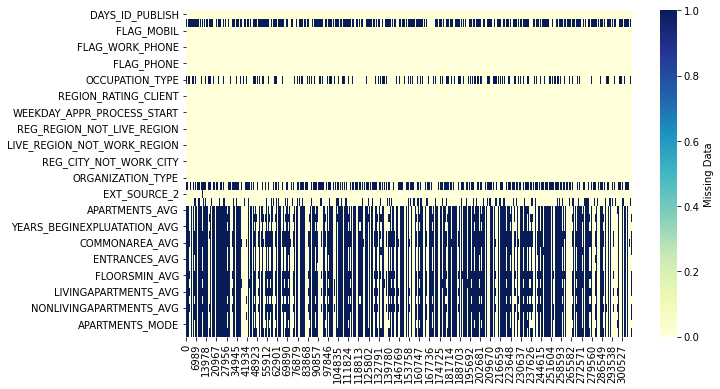

In [71]:
Plot("application_train")

In [72]:
def Missing_Plot1(dataset):
    plt.figure(figsize=(210,50))
    sns.displot(
    data=datasets[dataset].isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=3
    ).set(title='Missing Values Plot')


<Figure size 15120x3600 with 0 Axes>

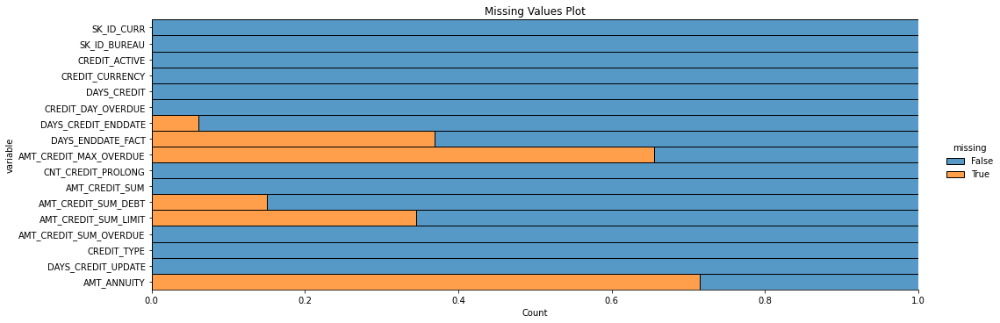

In [73]:
Missing_Plot1("bureau")

In [74]:
def Plot1(dataset):
    plt.figure(figsize=(10,6))
    sns.heatmap(datasets[dataset].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

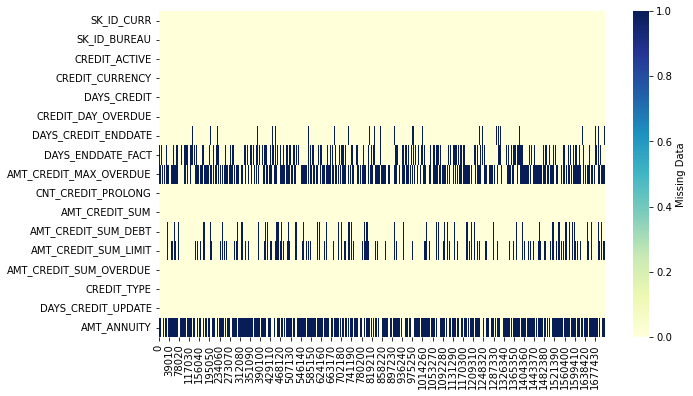

In [75]:
Plot1("bureau")

## Distribution of the target column 

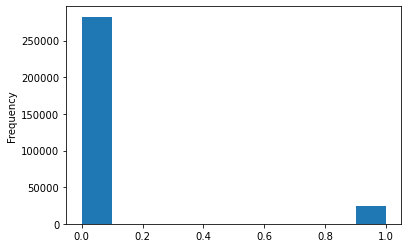

In [76]:
import matplotlib.pyplot as plt
%matplotlib inline

datasets["application_train"]['TARGET'].astype(int).plot.hist();

In [77]:
from collections import Counter
print(Counter(datasets['application_train']['TARGET']))

Counter({0: 282686, 1: 24825})


## Correlation with  the target column 

In [78]:
correlations = datasets["application_train"].corr()['TARGET'].sort_values(ascending= True)
print('Most Positive Correlations:\n',correlations.tail(40))
print('\n\n\nMost Negative Correlations:\n',correlations.head(40))

Most Positive Correlations:
 AMT_REQ_CREDIT_BUREAU_QRT     -0.002022
FLAG_EMAIL                    -0.001758
NONLIVINGAPARTMENTS_MODE      -0.001557
FLAG_DOCUMENT_7               -0.001520
FLAG_DOCUMENT_10              -0.001414
FLAG_DOCUMENT_19              -0.001358
FLAG_DOCUMENT_12              -0.000756
FLAG_DOCUMENT_5               -0.000316
FLAG_DOCUMENT_20               0.000215
FLAG_CONT_MOBILE               0.000370
FLAG_MOBIL                     0.000534
AMT_REQ_CREDIT_BUREAU_WEEK     0.000788
AMT_REQ_CREDIT_BUREAU_HOUR     0.000930
AMT_REQ_CREDIT_BUREAU_DAY      0.002704
LIVE_REGION_NOT_WORK_REGION    0.002819
FLAG_DOCUMENT_21               0.003709
FLAG_DOCUMENT_2                0.005417
REG_REGION_NOT_LIVE_REGION     0.005576
REG_REGION_NOT_WORK_REGION     0.006942
OBS_60_CNT_SOCIAL_CIRCLE       0.009022
OBS_30_CNT_SOCIAL_CIRCLE       0.009131
CNT_FAM_MEMBERS                0.009308
CNT_CHILDREN                   0.019187
AMT_REQ_CREDIT_BUREAU_YEAR     0.019930
FLAG_WORK_P

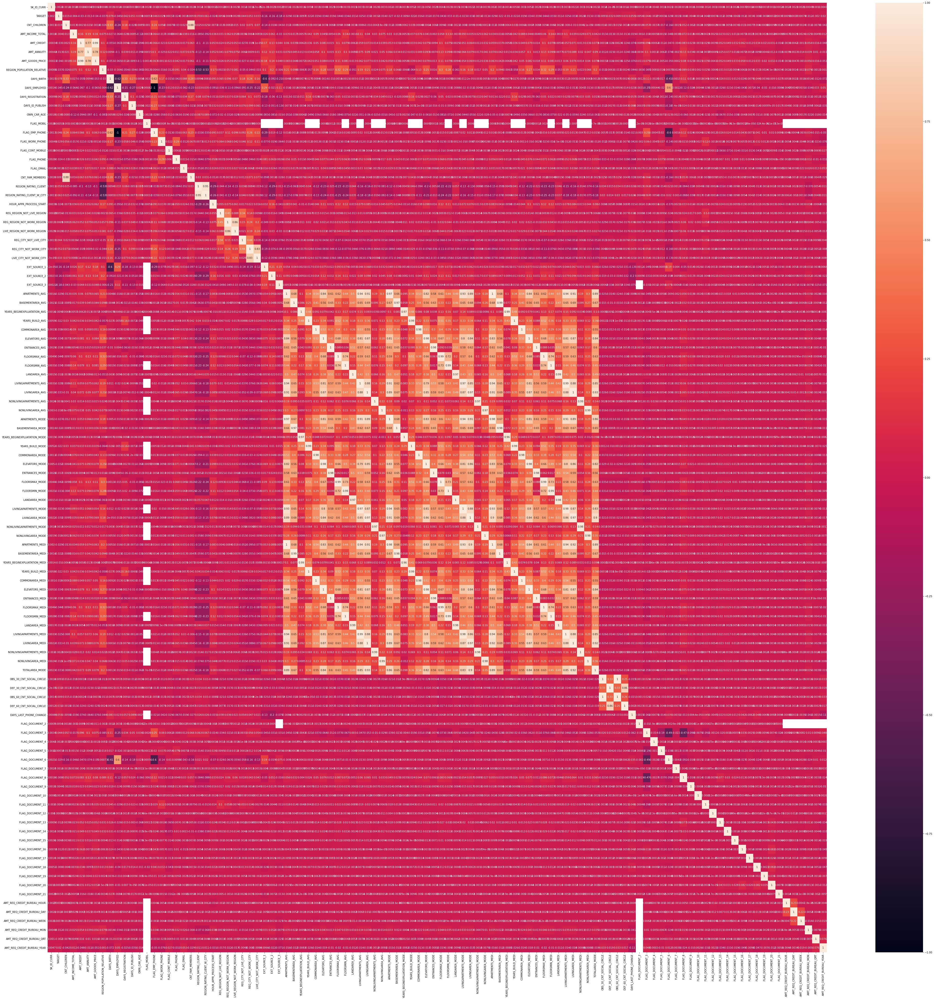

In [79]:
plt.figure(figsize = (70,70))
corrMap = sns.heatmap(datasets["application_train"].corr(), vmin=-1, vmax = 1, annot=True)


# Correlation of Target variable with other numerical features.

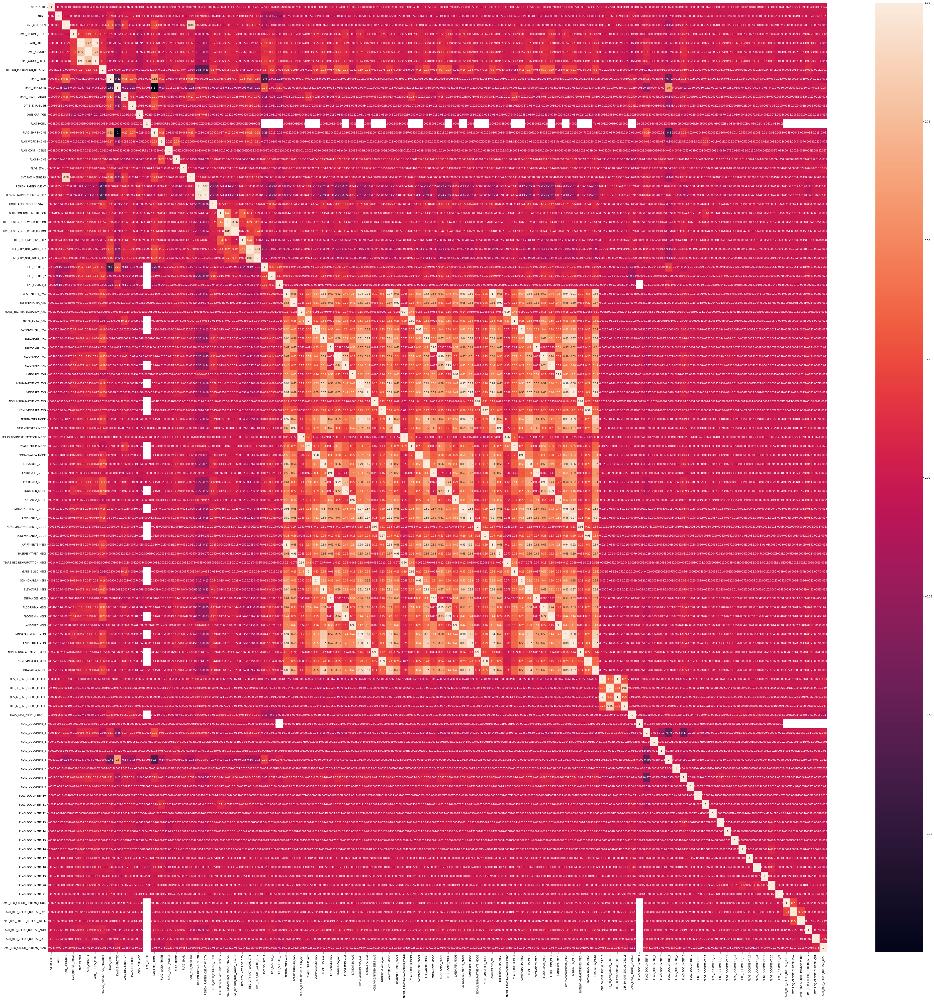

In [80]:
plt.figure(figsize = (70,70))
corrMap = sns.heatmap(datasets["application_train"].select_dtypes(include=np.number).corr(), annot=True)


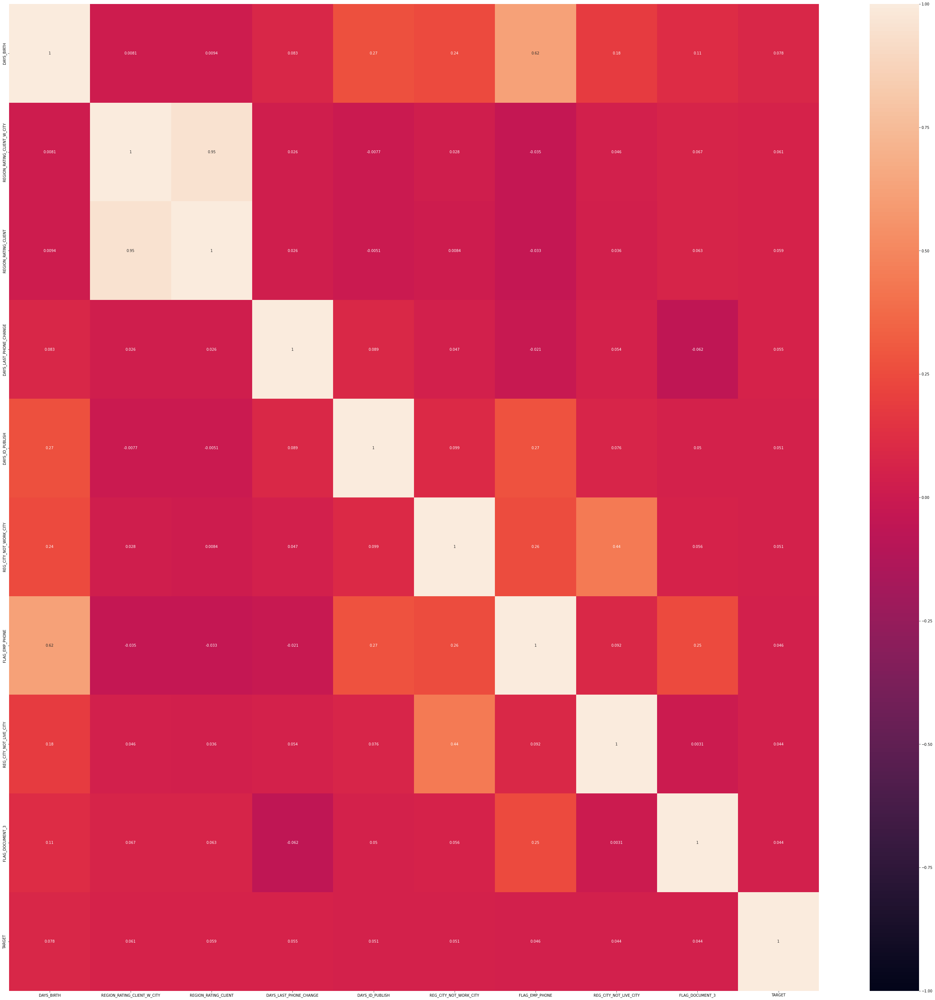

In [81]:
# Correlation map of highly positive correlated features of application train to TARGET
plt.figure(figsize = (50,50))
corr_cols = ['DAYS_BIRTH', 'REGION_RATING_CLIENT_W_CITY','REGION_RATING_CLIENT','DAYS_LAST_PHONE_CHANGE', 'DAYS_ID_PUBLISH',
             'REG_CITY_NOT_WORK_CITY','FLAG_EMP_PHONE','REG_CITY_NOT_LIVE_CITY', 'FLAG_DOCUMENT_3', 'TARGET']
corrMap = sns.heatmap(datasets["application_train"][corr_cols].corr(), vmin=-1, vmax=1, annot=True)

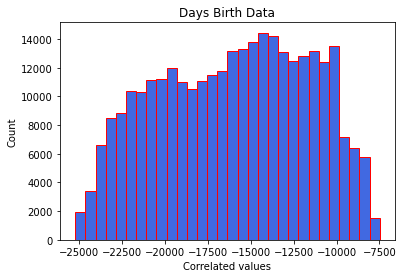

In [82]:
plt.hist((datasets["application_train"]['DAYS_BIRTH']),edgecolor='red', color='royalblue', bins =30)
plt.title('Days Birth Data'); plt.xlabel('Correlated values'); plt.ylabel('Count');

### People with higher secondary education have repaid the loan 

In [ ]:
categorical_plot('NAME_EDUCATION_TYPE', 'Spectral')

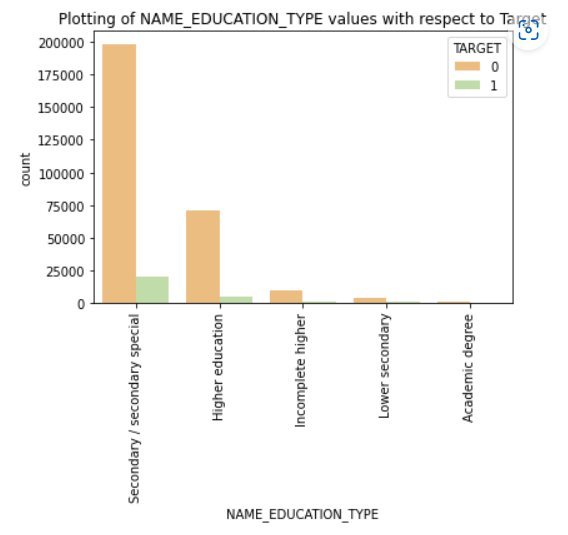

### Working people have often repayed loans

In [ ]:
categorical_plot('NAME_INCOME_TYPE', 'coolwarm')

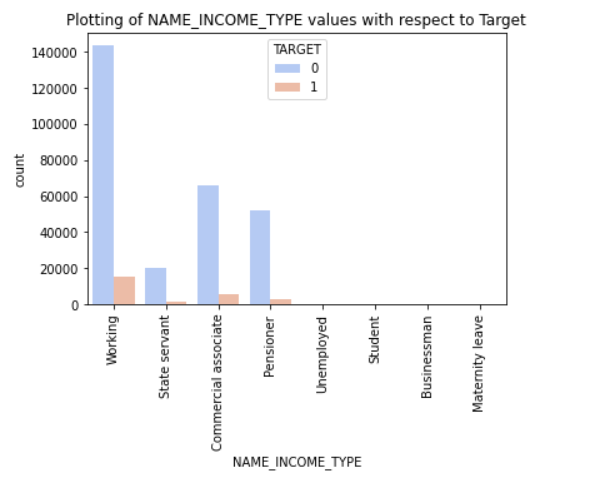

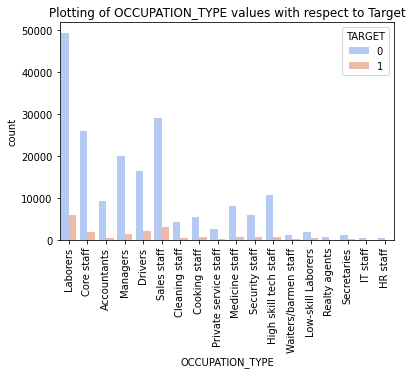

In [33]:
categorical_plot('OCCUPATION_TYPE', 'coolwarm')

## Applicants Age 

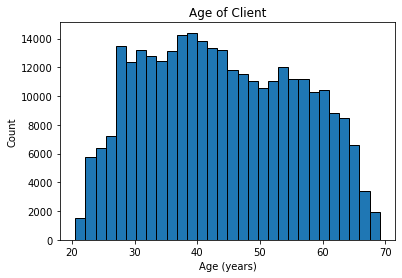

In [86]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 30)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

## Applicants occupations

### We can see from the plot that the labourers have paid largest loan followed by sales staffs. 

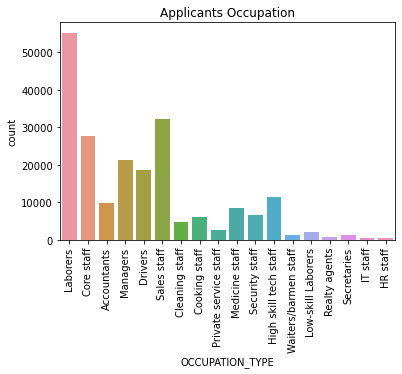

In [87]:
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"]);
plt.title('Applicants Occupation');
plt.xticks(rotation=90);

# Dataset questions
## Unique record for each SK_ID_CURR

In [45]:
list(datasets.keys())

['application_train', 'application_test', 'bureau']

In [89]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

True

In [90]:
# 
datasets["application_test"].shape

(48744, 121)

In [91]:
datasets["application_train"].shape

(307511, 122)

## previous applications for the submission file
The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [92]:
appsDF = datasets["previous_application"]
display(appsDF.head())
print(f"{appsDF.shape[0]:,} rows, {appsDF.shape[1]:,} columns")

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


1,670,214 rows, 37 columns


In [93]:
print(f"There are  {appsDF.shape[0]:,} previous applications")

There are  1,670,214 previous applications


In [94]:
#Find the intersection of two arrays.
print(f'Number of train applicants with previous applications is {len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_train"]["SK_ID_CURR"])):,}')

Number of train applicants with previous applications is 291,057


In [95]:
#Find the intersection of two arrays.
print(f'Number of train applicants with previous applications is {len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])):,}')

Number of train applicants with previous applications is 47,800


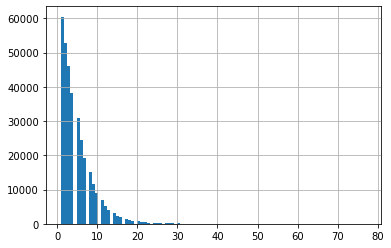

In [96]:
# How many previous applciations  per applicant in the previous_application 
prevAppCounts = appsDF['SK_ID_CURR'].value_counts(dropna=False)
len(prevAppCounts[prevAppCounts >40])  #more that 40 previous applications
plt.hist(prevAppCounts[prevAppCounts>=0], bins=100)
plt.grid()

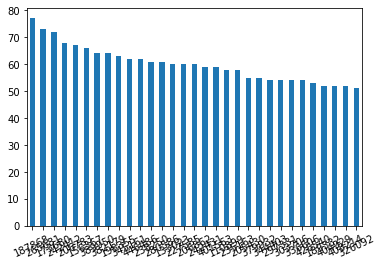

In [97]:
prevAppCounts[prevAppCounts >50].plot(kind='bar')
plt.xticks(rotation=25)
plt.show()

### Histogram of Number of previous applications for an ID

In [98]:
sum(appsDF['SK_ID_CURR'].value_counts()==1)

60458

Text(0.5, 1.0, 'Histogram of Number of previous applications for an ID')

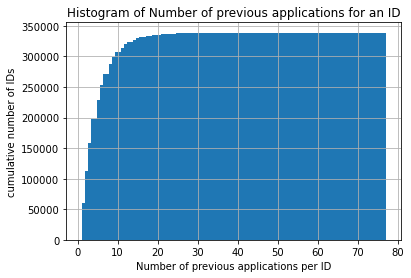

In [99]:
plt.hist(appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100);
plt.grid()
plt.ylabel('cumulative number of IDs')
plt.xlabel('Number of previous applications per ID')
plt.title('Histogram of Number of previous applications for an ID')


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

In [100]:
apps_all = appsDF['SK_ID_CURR'].nunique()
apps_5plus = appsDF['SK_ID_CURR'].value_counts()>=5
apps_40plus = appsDF['SK_ID_CURR'].value_counts()>=40
print('Percentage with 10 or more previous apps:', np.round(100.*(sum(apps_5plus)/apps_all),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(apps_40plus)/apps_all),5))

Percentage with 10 or more previous apps: 41.76895
Percentage with 40 or more previous apps: 0.03453


# Feature Selection

In [101]:
# pandas and numpy for data manipulation
import pandas as pd
import numpy as np

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns

# Suppress warnings from pandas
import warnings
warnings.filterwarnings('ignore')

plt.style.use('fivethirtyeight')

In [102]:
datasets['bureau'].head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [103]:
datasets['application_train'].shape

(307511, 122)

## Count number of previous loans for each SK_ID_CURR

In [104]:
previous_loan_counts = datasets['bureau'].groupby('SK_ID_CURR', as_index=False)['SK_ID_BUREAU'].count().rename(columns = {'SK_ID_BUREAU': 'previous_loan_counts'})
previous_loan_counts.head()

,SK_ID_CURR,previous_loan_counts
0,100001,7
1,100002,8
2,100003,4
3,100004,2
4,100005,3


In [105]:
datasets['application_train'] = datasets['application_train'].merge(previous_loan_counts, on = 'SK_ID_CURR', how = 'left')

In [106]:
datasets['application_train']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,previous_loan_counts
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,8.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0,4.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [43]:
datasets['application_train']['previous_loan_counts']

0          8.0
1          4.0
2          2.0
3          0.0
4          1.0
          ... 
307506     0.0
307507     0.0
307508     4.0
307509     1.0
307510    11.0
Name: previous_loan_counts, Length: 307511, dtype: float64

In [107]:
datasets['application_train']['previous_loan_counts'] = datasets['application_train']['previous_loan_counts'].fillna(0)
datasets['application_train']['previous_loan_counts'].head()

0    8.0
1    4.0
2    2.0
3    0.0
4    1.0
Name: previous_loan_counts, dtype: float64

In [126]:
! pip install lightgbm

In [19]:
import lightgbm as lgb
train = datasets['application_train']
feature_importances = np.zeros(train.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary', boosting_type = 'goss', n_estimators = 10000, class_weight = 'balanced')

In [130]:
datasets['application_train'].shape

(307511, 257)

# Feature Engineering

In [23]:
#Previous Applications
## count the number of previous applications for a given ID
prev_count = datasets["previous_application"][['SK_ID_CURR', 'SK_ID_PREV']].groupby('SK_ID_CURR').count()
datasets["previous_application"]['SK_ID_PREV'] = datasets["previous_application"]['SK_ID_CURR'].map(prev_count['SK_ID_PREV'])

## Average values for all other features in previous applications
prev_avg = datasets["previous_application"].groupby('SK_ID_CURR').mean()
prev_avg.columns = ['p_' + col for col in prev_avg.columns]
datasets['application_train'] = datasets['application_train'].merge(prev_avg, how='left', on='SK_ID_CURR')


In [25]:
prev_count

,SK_ID_PREV
SK_ID_CURR,
100001,1
100002,1
100003,3
100004,1
100005,2
...,...
456251,1
456252,1
456253,2


In [26]:
prev_avg

,p_SK_ID_PREV,p_AMT_ANNUITY,p_AMT_APPLICATION,p_AMT_CREDIT,p_AMT_DOWN_PAYMENT,p_AMT_GOODS_PRICE,p_HOUR_APPR_PROCESS_START,p_NFLAG_LAST_APPL_IN_DAY,p_RATE_DOWN_PAYMENT,p_RATE_INTEREST_PRIMARY,p_RATE_INTEREST_PRIVILEGED,p_DAYS_DECISION,p_SELLERPLACE_AREA,p_CNT_PAYMENT,p_DAYS_FIRST_DRAWING,p_DAYS_FIRST_DUE,p_DAYS_LAST_DUE_1ST_VERSION,p_DAYS_LAST_DUE,p_DAYS_TERMINATION,p_NFLAG_INSURED_ON_APPROVAL
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,
100001,1.0,3951.000000,24835.500,23787.00,2520.00,24835.500,13.000000,1.0,0.104326,NaN,NaN,-1740.000,23.000,8.00,365243.0,-1709.000000,-1499.000000,-1619.000000,-1612.000000,0.000000
100002,1.0,9251.775000,179055.000,179055.00,0.00,179055.000,9.000000,1.0,0.000000,NaN,NaN,-606.000,500.000,24.00,365243.0,-565.000000,125.000000,-25.000000,-17.000000,0.000000
100003,3.0,56553.990000,435436.500,484191.00,3442.50,435436.500,14.666667,1.0,0.050030,NaN,NaN,-1305.000,533.000,10.00,365243.0,-1274.333333,-1004.333333,-1054.333333,-1047.333333,0.666667
100004,1.0,5357.250000,24282.000,20106.00,4860.00,24282.000,5.000000,1.0,0.212008,NaN,NaN,-815.000,30.000,4.00,365243.0,-784.000000,-694.000000,-724.000000,-714.000000,0.000000
100005,2.0,4813.200000,22308.750,20076.75,4464.00,44617.500,10.500000,1.0,0.108964,NaN,NaN,-536.000,18.000,12.00,365243.0,-706.000000,-376.000000,-466.000000,-460.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456251,1.0,6605.910000,40455.000,40455.00,0.00,40455.000,17.000000,1.0,0.000000,NaN,NaN,-273.000,30.000,8.00,365243.0,-210.000000,0.000000,-30.000000,-25.000000,0.000000
456252,1.0,10074.465000,57595.500,56821.50,3456.00,57595.500,10.000000,1.0,0.062443,NaN,NaN,-2497.000,190.000,6.00,365243.0,-2466.000000,-2316.000000,-2316.000000,-2311.000000,1.000000
456253,2.0,4770.405000,24162.750,20625.75,4403.25,24162.750,11.500000,1.0,0.214316,NaN,NaN,-2380.000,22.000,5.00,365243.0,-2339.000000,-2219.000000,-2219.000000,-2212.500000,0.500000


In [52]:
cnt_inst

,SK_ID_PREV
SK_ID_CURR,
100001,7
100002,19
100003,25
100004,3
100005,9
...,...
456251,7
456252,6
456253,14


In [28]:
datasets['application_test']['is_test'] = 1 
datasets['application_train']['is_train'] = 0
datasets['application_test']['is_test'] = 0
datasets['application_train']['is_train'] = 1

In [29]:
#### prepare final Train X and Test X dataframes 
ignored_feat = ['SK_ID_CURR', 'is_train', 'is_test']
imp_feat = [col for col in datasets['application_test'].columns if col not in ignored_feat]
trainX = datasets['application_train'][datasets['application_train']['is_train'] == 1][imp_feat]
testX = datasets['application_test'][datasets['application_test']['is_test'] == 1][imp_feat]

In [30]:
x_train, x_val, y_train, y_val = train_test_split(trainX, datasets['application_train']['TARGET'], test_size=0.2, random_state=18)
LGB_train = lgb.Dataset(data=x_train._get_numeric_data(), label=y_train)
LGB_eval = lgb.Dataset(data=x_val._get_numeric_data(), label=y_val)

In [31]:
x_train

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
100576,Cash loans,F,N,Y,0,67500.0,123993.0,8446.5,103500.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,1.0,0.0,3.0
130805,Cash loans,F,N,Y,2,90000.0,545040.0,25537.5,450000.0,"Spouse, partner",...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
117463,Revolving loans,F,N,Y,0,60750.0,135000.0,6750.0,135000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,1.0,0.0,2.0
267916,Cash loans,F,N,N,0,270000.0,1802385.0,50607.0,1611000.0,Unaccompanied,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
201208,Cash loans,M,Y,N,0,180000.0,900000.0,40801.5,900000.0,Family,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258626,Cash loans,M,N,Y,0,360000.0,427869.0,46210.5,387000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
215282,Cash loans,F,N,Y,0,72000.0,148500.0,14818.5,148500.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,1.0,0.0,4.0
180145,Cash loans,M,Y,Y,0,99000.0,819432.0,29160.0,684000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,1.0,0.0,0.0,3.0
263870,Cash loans,F,N,Y,0,135000.0,254700.0,24939.0,225000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


In [32]:
params = {'task': 'train', 'boosting_type': 'gbdt', 'objective': 'binary', 'metric': 'auc', 
          'learning_rate': 0.01, 'num_leaves': 48, 'num_iteration': 5000, 'verbose': -1 ,
          'colsample_bytree':.8, 'subsample':.9, 'max_depth':7, 'reg_alpha':.1, 'reg_lambda':.1, 
          'min_split_gain':.01, 'min_child_weight':1, 'force_col_wise': 'true'}
model = lgb.train(params, lgb_train, valid_sets=LGB_eval, early_stopping_rounds=150, verbose_eval=200)

Training until validation scores don't improve for 150 rounds
[200]	valid_0's auc: 0.741487
[400]	valid_0's auc: 0.748633
[600]	valid_0's auc: 0.751602
[800]	valid_0's auc: 0.752571
[1000]	valid_0's auc: 0.75319
[1200]	valid_0's auc: 0.753468
[1400]	valid_0's auc: 0.753507
Early stopping, best iteration is:
[1304]	valid_0's auc: 0.75356


## Feature Importance

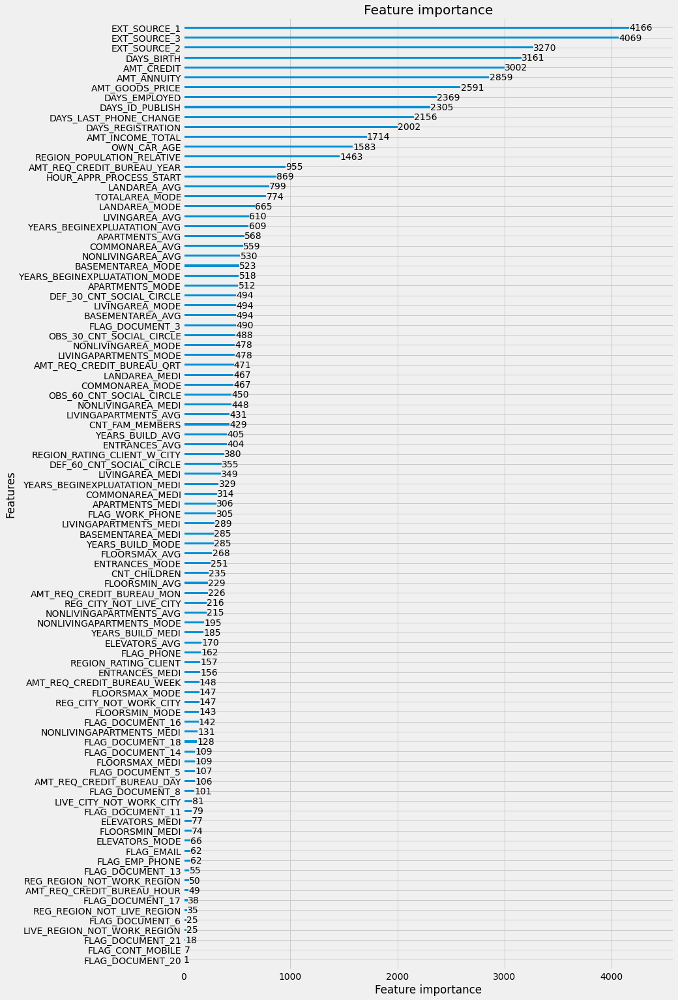

In [73]:
lgb.plot_importance(model, figsize=(12, 25), max_num_features=100);

In [33]:
datasets['application_train'].columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'p_DAYS_DECISION', 'p_SELLERPLACE_AREA', 'p_CNT_PAYMENT',
       'p_DAYS_FIRST_DRAWING', 'p_DAYS_FIRST_DUE',
       'p_DAYS_LAST_DUE_1ST_VERSION', 'p_DAYS_LAST_DUE', 'p_DAYS_TERMINATION',
       'p_NFLAG_INSURED_ON_APPROVAL', 'is_train'],
      dtype='object', length=143)

In [34]:
correlations = datasets["application_train"].corr()['TARGET'].sort_values(ascending= True)
print('Most Positive Correlations:\n',correlations.tail(40))
print('\n\n\nMost Negative Correlations:\n',correlations.head(40))

Most Positive Correlations:
 FLAG_DOCUMENT_20               0.000215
FLAG_CONT_MOBILE               0.000370
FLAG_MOBIL                     0.000534
AMT_REQ_CREDIT_BUREAU_WEEK     0.000788
AMT_REQ_CREDIT_BUREAU_HOUR     0.000930
AMT_REQ_CREDIT_BUREAU_DAY      0.002704
LIVE_REGION_NOT_WORK_REGION    0.002819
FLAG_DOCUMENT_21               0.003709
FLAG_DOCUMENT_2                0.005417
REG_REGION_NOT_LIVE_REGION     0.005576
REG_REGION_NOT_WORK_REGION     0.006942
OBS_60_CNT_SOCIAL_CIRCLE       0.009022
OBS_30_CNT_SOCIAL_CIRCLE       0.009131
CNT_FAM_MEMBERS                0.009308
CNT_CHILDREN                   0.019187
p_SK_ID_PREV                   0.019762
AMT_REQ_CREDIT_BUREAU_YEAR     0.019930
p_DAYS_TERMINATION             0.025795
p_DAYS_LAST_DUE                0.026923
p_CNT_PAYMENT                  0.027743
FLAG_WORK_PHONE                0.028524
p_RATE_INTEREST_PRIVILEGED     0.031144
p_DAYS_LAST_DUE_1ST_VERSION    0.031203
DEF_60_CNT_SOCIAL_CIRCLE       0.031276
DEF_30_CNT_

# Processing pipeline

###  OHE when previously unseen unique values in the test/validation set

Train, validation and Test sets (and the leakage problem we have mentioned previously):

 

Let's look at a small usecase to tell us how to deal with this:

* The OneHotEncoder is fitted to the training set, which means that for each unique value present in the training set, for each feature, a new column is created. Let's say we have 39 columns after the encoding up from 30 (before preprocessing).
* The output is a numpy array (when the option sparse=False is used), which has the disadvantage of losing all the information about the original column names and values.
* When we try to transform the test set, after having fitted the encoder to the training set, we obtain a `ValueError`. This is because the there are new, previously unseen unique values in the test set and the encoder doesn’t know how to handle these values. In order to use both the transformed training and test sets in machine learning algorithms, we need them to have the same number of columns.

This last problem can be solved by using the option handle_unknown='ignore'of the OneHotEncoder, which, as the name suggests, will ignore previously unseen values when transforming the test set.

 

Here is a example that in action:

```python
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

```


In [91]:
def drop_na(df):
    threshold = 15.0

    min_count =  int(((100-threshold)/100)*df.shape[0] + 1)
    mod_df = df.dropna( axis=1, 
                    thresh=min_count)
    return mod_df

In [92]:
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline
from sklearn.compose import ColumnTransformer
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.model_selection import train_test_split  # sklearn.cross_validation in old versions
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from time import time


datasets['application_train'] = drop_na(datasets['application_train'])
application_train = datasets['application_train']



application_train.head(10)
y = application_train['TARGET']
X = application_train.drop(['TARGET'], axis = 1)
                  
# Split the provided training data into training and validationa and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)
print(f"X train           shape: {X_train.shape}")
print(f"X validation      shape: {X_valid.shape}")

# determine categorical and numerical features
numerical_features = list(X.select_dtypes(include=['int64', 'float64']).columns)
categorical_features = list(X.select_dtypes(include=['object', 'bool']).columns)
print(f"numerical_features are  : {numerical_features}")
print(f"categorical_features are: {categorical_features}")


X train           shape: (246008, 70)
X validation      shape: (61503, 70)
numerical_features are  : ['SK_ID_CURR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FL

In [93]:
X_test.shape

(46127, 70)

In [94]:
X_train.shape

(246008, 70)

In [95]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier

In [96]:
data_pipeline = make_column_transformer( #Level 2
    (make_pipeline(SimpleImputer(strategy = 'median'), StandardScaler()),      numerical_features), #level 3
    (make_pipeline(SimpleImputer(strategy='most_frequent'), 
                   OneHotEncoder(handle_unknown='ignore')), categorical_features)  
  )
X_train_transformed = data_pipeline.fit_transform(X_train)
print(type(X_train_transformed))
column_names = numerical_features  + list(data_pipeline.transformers_[1][1].named_steps["onehotencoder"].get_feature_names(categorical_features))
display(pd.DataFrame(X_train_transformed,  columns=column_names).head())
number_of_inputs = X_train_transformed.shape[1]


<class 'numpy.ndarray'>


,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
0,-0.341075,-0.577566,0.024310,-0.110068,-0.741102,-0.203848,1.080973,-1.676136,2.132885,0.394791,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,-1.619000,0.810045,-0.104840,-0.996174,-0.239942,-0.994617,-0.783245,1.173499,-0.452704,0.199982,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-1.003644,-0.577566,-0.320090,0.438262,-0.134190,0.294944,1.080973,-1.644952,-0.467140,-0.197305,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.912957,0.810045,-0.041385,0.745126,0.666239,0.976222,0.716451,1.223484,-0.469780,0.672239,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.925258,-0.577566,0.540909,-0.163664,-0.401517,-0.167351,0.311838,0.055244,-0.476786,-0.857840,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [97]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import log_loss

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true.ravel() - y_pred.ravel()) / y_true.ravel())) * 100

In [144]:
X_train_transformed = data_pipeline.fit_transform(X_train)
column_names = numerical_features  + list(data_pipeline.transformers_[1][1].named_steps["onehotencoder"].get_feature_names(categorical_features))
number_of_inputs = X_train_transformed.shape[1]

# Now we can combine this preprocessing step based on the ColumnTransformer with a
# classifier in a Pipeline to predict whether passengers of the Titanic survived or not:
clf_pipe = make_pipeline( #level 1
    data_pipeline,
    LogisticRegression())

# Time and score test predictions
start = time()
clf_pipe.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = clf_pipe.score(X_train, y_train)
validAcc  = clf_pipe.score(X_valid, y_valid)
start = time()
testAcc  = clf_pipe.score(X_test, y_test)
test_time = np.round(time() - start, 4)

### For AUC
from sklearn import metrics
y_pred_proba_train = clf_pipe.predict(X_train)
auc_train = np.round(metrics.roc_auc_score(y_train, y_pred_proba_train),5)

y_pred_proba_valid = clf_pipe.predict(X_valid)
auc_valid = np.round(metrics.roc_auc_score(y_valid, y_pred_proba_valid),5)

y_pred_proba_test = clf_pipe.predict(X_test)
auc_test = np.round(metrics.roc_auc_score(y_test, y_pred_proba_test),5)


## Train loss calculations
mse_train = mean_squared_error(y_train, y_pred_proba_train)
rmse_train = np.sqrt(np.round(mse_train,5))
rmse_train = np.round(rmse_train,5)
print("Train RMSE",rmse_train)

log_loss_train = np.round(log_loss(y_train, y_pred_proba_train),5)
print(" Train LL",log_loss_train)

mae_train = np.round(mean_absolute_error(y_train, y_pred_proba_train),5)
print("Train MAE",mae_train)


## Test Loss Calculation
mse_test = mean_squared_error(y_test, y_pred_proba_test)
rmse_test = np.sqrt(np.round(mse_test,5))
rmse_test = np.round(rmse_test,5)
print("Test RMSE",rmse_test)

log_loss_test = np.round(log_loss(y_test, y_pred_proba_test),5)
print("Test LL",log_loss_test)

mae_test = np.round(mean_absolute_error(y_test, y_pred_proba_test),5)
print("Test MAE",mae_test)

## Validation set Loss Calculation
mse_valid = mean_squared_error(y_valid, y_pred_proba_valid)
rmse_valid = np.sqrt(np.round(mse_valid,5))
rmse_valid = np.round(rmse_valid,5)
print("Valid_RMSE",rmse_valid)

log_loss_valid = np.round(log_loss(y_valid, y_pred_proba_valid),5)
print("LL_valid",log_loss_valid)

mae_valid = np.round(mean_absolute_error(y_valid, y_pred_proba_valid),5)
print("MAE_valid",mae_valid)





#del experimentLog
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc", "AUC Train", "AUC Valid", "AUC Test", 
                                               "RMSE Train","LogLoss Train","MAE Train","RMSE Test",
                                               "LogLoss Test","MAE Test","RMSE Valid","LogLoss Valid",
                                               "MAE Valid","Train Time(s)", "Test Time(s)"])
experimentLog.loc[len(experimentLog)] =[f"Baseline 1 Logistic Regression with {number_of_inputs} inputs", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", auc_train, auc_valid, auc_test, 
                                        rmse_train,log_loss_train,mae_train,rmse_test,log_loss_test,mae_test,
                                        rmse_valid, log_loss_valid, mae_valid,train_time, test_time]

display(experimentLog)

Train RMSE 0.28424
 Train LL 2.79025
Train MAE 0.08079
Test RMSE 0.28432
Test LL 2.79219
Test MAE 0.08084
Valid_RMSE 0.28432
LL_valid 2.79217
MAE_valid 0.08084


,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,AUC Train,AUC Valid,AUC Test,RMSE Train,LogLoss Train,MAE Train,RMSE Test,LogLoss Test,MAE Test,RMSE Valid,LogLoss Valid,MAE Valid,Train Time(s),Test Time(s)
0,Baseline 1 Logistic Regression with 232 inputs,HCDR,91.92%,91.92%,91.92%,0.50833,0.508,0.50845,0.28424,2.79025,0.08079,0.28432,2.79219,0.08084,0.28432,2.79217,0.08084,7.3146,0.2136


In [145]:
    
    
X_train_transformed = data_pipeline.fit_transform(X_train)
column_names = numerical_features  + list(data_pipeline.transformers_[1][1].named_steps["onehotencoder"].get_feature_names(categorical_features))
number_of_inputs = X_train_transformed.shape[1]

# Now we can combine this preprocessing step based on the ColumnTransformer with a
# classifier in a Pipeline to predict whether passengers of the Titanic survived or not:
clf_pipe = make_pipeline( #level 1
    data_pipeline,
    Perceptron(random_state = 42))

# Time and score test predictions
start = time()
clf_pipe.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = clf_pipe.score(X_train, y_train)
validAcc  = clf_pipe.score(X_valid, y_valid)
start = time()
testAcc  = clf_pipe.score(X_test, y_test)
test_time = np.round(time() - start, 4)

### For AUC
from sklearn import metrics
y_pred_proba_train = clf_pipe.predict(X_train)
auc_train = np.round(metrics.roc_auc_score(y_train, y_pred_proba_train),5)

y_pred_proba_valid = clf_pipe.predict(X_valid)
auc_valid = np.round(metrics.roc_auc_score(y_valid, y_pred_proba_valid),5)

y_pred_proba_test = clf_pipe.predict(X_test)
auc_test = np.round(metrics.roc_auc_score(y_test, y_pred_proba_test),5)


## Train loss calculations
mse_train = mean_squared_error(y_train, y_pred_proba_train)
rmse_train = np.sqrt(np.round(mse_train,5))
rmse_train = np.round(rmse_train,5)
print("Train RMSE",rmse_train)

log_loss_train = np.round(log_loss(y_train, y_pred_proba_train),5)
print(" Train LL",log_loss_train)

mae_train = np.round(mean_absolute_error(y_train, y_pred_proba_train),5)
print("Train MAE",mae_train)


## Test Loss Calculation
mse_test = mean_squared_error(y_test, y_pred_proba_test)
rmse_test = np.sqrt(np.round(mse_test,5))
rmse_test = np.round(rmse_test,5)
print("Test RMSE",rmse_test)

log_loss_test = np.round(log_loss(y_test, y_pred_proba_test),5)
print("Test LL",log_loss_test)

mae_test = np.round(mean_absolute_error(y_test, y_pred_proba_test),5)
print("Test MAE",mae_test)

## Validation set Loss Calculation
mse_valid = mean_squared_error(y_valid, y_pred_proba_valid)
rmse_valid = np.sqrt(np.round(mse_valid,5))
rmse_valid = np.round(rmse_valid,5)
print("Valid_RMSE",rmse_valid)

log_loss_valid = np.round(log_loss(y_valid, y_pred_proba_valid),5)
print("LL_valid",log_loss_valid)

mae_valid = np.round(mean_absolute_error(y_valid, y_pred_proba_valid),5)
print("MAE_valid",mae_valid)





#del experimentLog
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc", "AUC Train", "AUC Valid", "AUC Test", 
                                               "RMSE Train","LogLoss Train","MAE Train","RMSE Test",
                                               "LogLoss Test","MAE Test","RMSE Valid","LogLoss Valid",
                                               "MAE Valid","Train Time(s)", "Test Time(s)"])
experimentLog.loc[len(experimentLog)] =[f"Baseline 1 Perceptron with {number_of_inputs} inputs", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", auc_train, auc_valid, auc_test, 
                                        rmse_train,log_loss_train,mae_train,rmse_test,log_loss_test,mae_test,
                                        rmse_valid, log_loss_valid, mae_valid,train_time, test_time]

display(experimentLog)

Train RMSE 0.31727
 Train LL 3.47653
Train MAE 0.10066
Test RMSE 0.31442
Test LL 3.41444
Test MAE 0.09886
Valid_RMSE 0.31467
LL_valid 3.42003
MAE_valid 0.09902


,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,AUC Train,AUC Valid,AUC Test,RMSE Train,LogLoss Train,MAE Train,RMSE Test,LogLoss Test,MAE Test,RMSE Valid,LogLoss Valid,MAE Valid,Train Time(s),Test Time(s)
0,Baseline 1 Logistic Regression with 232 inputs,HCDR,91.92%,91.92%,91.92%,0.50833,0.5080,0.50845,0.28424,2.79025,0.08079,0.28432,2.79219,0.08084,0.28432,2.79217,0.08084,7.3146,0.2136
1,Baseline 1 Perceptron with 232 inputs,HCDR,89.93%,90.10%,90.11%,0.51746,0.5196,0.51890,0.31727,3.47653,0.10066,0.31442,3.41444,0.09886,0.31467,3.42003,0.09902,6.4339,0.2136


In [87]:
    
    
X_train_transformed = data_pipeline.fit_transform(X_train)
column_names = numerical_features  + list(data_pipeline.transformers_[1][1].named_steps["onehotencoder"].get_feature_names(categorical_features))
number_of_inputs = X_train_transformed.shape[1]

# Now we can combine this preprocessing step based on the ColumnTransformer with a
# classifier in a Pipeline to predict whether passengers of the Titanic survived or not:
clf_pipe = make_pipeline( #level 1
    data_pipeline,
    RandomForestClassifier(max_depth=1))

# Time and score test predictions
start = time()
clf_pipe.fit(X_train, y_train)
train_time = np.round(time() - start, 4)

trainAcc  = clf_pipe.score(X_train, y_train)
validAcc  = clf_pipe.score(X_valid, y_valid)
start = time()
testAcc  = clf_pipe.score(X_test, y_test)
test_time = np.round(time() - start, 4)

### For AUC
from sklearn import metrics
y_pred_proba_train = clf_pipe.predict(X_train)
auc_train = np.round(metrics.roc_auc_score(y_train, y_pred_proba_train),5)

y_pred_proba_valid = clf_pipe.predict(X_valid)
auc_valid = np.round(metrics.roc_auc_score(y_valid, y_pred_proba_valid),5)

y_pred_proba_test = clf_pipe.predict(X_test)
auc_test = np.round(metrics.roc_auc_score(y_test, y_pred_proba_test),5)


## Train loss calculations
mse_train = mean_squared_error(y_train, y_pred_proba_train)
rmse_train = np.sqrt(np.round(mse_train,5))
rmse_train = np.round(rmse_train,5)
print("Train RMSE",rmse_train)

log_loss_train = np.round(log_loss(y_train, y_pred_proba_train),5)
print(" Train LL",log_loss_train)

mae_train = np.round(mean_absolute_error(y_train, y_pred_proba_train),5)
print("Train MAE",mae_train)


## Test Loss Calculation
mse_test = mean_squared_error(y_test, y_pred_proba_test)
rmse_test = np.sqrt(np.round(mse_test,5))
rmse_test = np.round(rmse_test,5)
print("Test RMSE",rmse_test)

log_loss_test = np.round(log_loss(y_test, y_pred_proba_test),5)
print("Test LL",log_loss_test)

mae_test = np.round(mean_absolute_error(y_test, y_pred_proba_test),5)
print("Test MAE",mae_test)

## Validation set Loss Calculation
mse_valid = mean_squared_error(y_valid, y_pred_proba_valid)
rmse_valid = np.sqrt(np.round(mse_valid,5))
rmse_valid = np.round(rmse_valid,5)
print("Valid_RMSE",rmse_valid)

log_loss_valid = np.round(log_loss(y_valid, y_pred_proba_valid),5)
print("LL_valid",log_loss_valid)

mae_valid = np.round(mean_absolute_error(y_valid, y_pred_proba_valid),5)
print("MAE_valid",mae_valid)





#del experimentLog
try: experimentLog 
except : experimentLog = pd.DataFrame(columns=["Pipeline", "Dataset", "TrainAcc", "ValidAcc", "TestAcc", "AUC Train", "AUC Valid", "AUC Test", 
                                               "RMSE Train","LogLoss Train","MAE Train","RMSE Test",
                                               "LogLoss Test","MAE Test","RMSE Valid","LogLoss Valid",
                                               "MAE Valid","Train Time(s)", "Test Time(s)"])
experimentLog.loc[len(experimentLog)] =[f"Baseline 1 RandomForestClassifier with {number_of_inputs} inputs", "HCDR", 
                                        f"{trainAcc*100:8.2f}%", f"{validAcc*100:8.2f}%", f"{testAcc*100:8.2f}%", auc_train, auc_valid, auc_test, 
                                        rmse_train,log_loss_train,mae_train,rmse_test,log_loss_test,mae_test,
                                        rmse_valid, log_loss_valid, mae_valid,train_time, test_time]

display(experimentLog)

Train RMSE 0.28424
 Train LL 2.79053
Train MAE 0.08079
Test RMSE 0.28387
Test LL 2.7832
Test MAE 0.08058
Valid_RMSE 0.28367
LL_valid 2.77925
MAE_valid 0.08047


,Pipeline,Dataset,TrainAcc,ValidAcc,TestAcc,AUC Train,AUC Valid,AUC Test,RMSE Train,LogLoss Train,MAE Train,RMSE Test,LogLoss Test,MAE Test,RMSE Valid,LogLoss Valid,MAE Valid,Train Time(s),Test Time(s)
0,Baseline 1 Logistic Regression with 206 inputs,HCDR,91.92%,91.94%,91.93%,0.50697,0.50748,0.50781,0.28432,2.79222,0.08084,0.28402,2.78620,0.08067,0.28392,2.78431,0.08061,25.3326,0.7769
1,Baseline 1 Logistic Regression with 206 inputs,HCDR,91.92%,91.94%,91.93%,0.50697,0.50748,0.50781,0.28432,2.79222,0.08084,0.28402,2.78620,0.08067,0.28392,2.78431,0.08061,24.4564,0.4956
2,Baseline 1 Perceptron with 206 inputs,HCDR,88.01%,87.96%,88.01%,0.53047,0.52592,0.52783,0.34632,4.14259,0.11994,0.34628,4.14152,0.11991,0.34706,4.16021,0.12045,8.3796,0.5945
3,Baseline 1 RandomForestClassifier with 206 inputs,HCDR,91.92%,91.95%,91.94%,0.50000,0.50000,0.50000,0.28424,2.79053,0.08079,0.28387,2.78320,0.08058,0.28367,2.77925,0.08047,23.5954,0.5931


In [158]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.neural_network import MLPClassifier


In [164]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import log_loss
from sklearn.ensemble import AdaBoostClassifier
from scipy import stats
from sklearn.neural_network import MLPClassifier
import pandas as pd
from sklearn.model_selection import cross_val_score, ShuffleSplit

In [165]:
def pct(x):
    return round(100*x,1)
# Set up ShuffleSplit for p_value testing
cv = ShuffleSplit(n_splits=30, test_size=0.3, random_state=0)

In [166]:
def ttest(control, treatment):
    #paired t-test; two-tailed p-value      A   ,    B
    (t_score, p_value) = stats.ttest_rel(control, treatment)

    if p_value > 0.05/2:  #Two sided 
        print('There is no significant difference between the two machine learning pipelines (Accept H0)')
    else:
        print('The two machine learning pipelines are different (reject H0) \n(t_score, p_value) = (%.2f, %.5f)'%(t_score, p_value) )
        if t_score > 0.0: #in the case of regression lower RMSE is better; A is lower 
            print('Machine learning pipeline A is better than B')
        else:
            print('Machine learning pipeline B is better than A')
    return p_value

In [168]:
results = pd.DataFrame(columns=["ExpID", "p-value","Train accuracy","Test Accuracy", "Train Time(s)", "Test Time(s)", "Experiment description"])

In [169]:
pipe_lr =  Pipeline([('preprocess',data_pipeline),
 ('clf', LogisticRegression(random_state=42))])


pipe_dt =  Pipeline([('preprocess',data_pipeline),
 ('clf', DecisionTreeClassifier(random_state=42))])

In [170]:
pipe_ab =  Pipeline([('preprocess',data_pipeline),
 ('clf',  AdaBoostClassifier())])

In [171]:
pipe_rf =  Pipeline([('preprocess',data_pipeline),
('clf', RandomForestClassifier())])

In [172]:
pipe_mlp = Pipeline([('preprocess',data_pipeline),
 ('clf', MLPClassifier(random_state=42))])


In [175]:
### Random Forest

param_range = [1, 3]
param_range_fl = [1.0, 0.5]

grid_params_rf = [{'clf__criterion': ['gini', 'entropy'],
        'clf__max_depth': param_range,
        'clf__min_samples_split': param_range[1:]}]

jobs = -1

RF = GridSearchCV(estimator=pipe_rf,
            param_grid=grid_params_rf,
            scoring='accuracy',
            cv=5, 
            n_jobs=jobs)




grids = [RF]

grid_dict = {0: 'Random Forest',
            }


print('Performing model optimizations...')
best_acc = 0.0
best_clf = 0
best_gs = ''
for idx, gs in enumerate(grids):
    print('\nEstimator: %s' % grid_dict[idx])
    start = time()
    gs.fit(X_train, y_train)
    train_time = np.round(time() - start, 4)
    print('Best params are : %s' % gs.best_params_)
    print('train time : %s' % train_time)
    # Best training data accuracy
    print('Best training accuracy: %.7f' % gs.best_score_)
    # Predict on test data with best params
    start = time()
    y_pred = gs.predict(X_test)
    test_time = np.round(time() - start, 4)
    # Test data accuracy of model with best params
    print('Test set accuracy score for best params: %.7f ' % accuracy_score(y_test, y_pred))
    print('test time : %s' % test_time)
    cv30Splits = ShuffleSplit(n_splits=30 , test_size=0.3,random_state=0)
    logit_scores_valid = cross_val_score(pipe_rf,X_valid,y_valid,cv = cv30Splits)
    best_validation_scores = cross_val_score(gs.best_estimator_, X_valid,y_valid, cv = cv30Splits)
    (t_stat, p_value) = stats.ttest_rel(logit_scores_valid, best_validation_scores)
    results.loc[0] = ["Random Forest",p_value,gs.best_score_ ,accuracy_score(y_test, y_pred), train_time, test_time, gs.best_params_]
    print(results)
    # Track best (highest test accuracy) model
    if accuracy_score(y_test, y_pred) > best_acc:
        best_acc = accuracy_score(y_test, y_pred)
        best_gs = gs
        best_clf = idx
       
print('\nClassifier with best test set accuracy: %s' % grid_dict[best_clf])

Performing model optimizations...

Estimator: Random Forest
Best params are : {'clf__criterion': 'gini', 'clf__max_depth': 1, 'clf__min_samples_split': 3}
train time : 96.7233
Best training accuracy: 0.9192059
Test set accuracy score for best params: 0.9194181 
test time : 0.4367
           ExpID   p-value  Train accuracy  Test Accuracy  Train Time(s)  \
0  Random Forest  0.133973        0.919206       0.919418        96.7233   

   Test Time(s)                             Experiment description  
0        0.4367  {'clf__criterion': 'gini', 'clf__max_depth': 1...  

Classifier with best test set accuracy: Random Forest


In [177]:
display(results)

,ExpID,p-value,Train accuracy,Test Accuracy,Train Time(s),Test Time(s),Experiment description
0,Random Forest,0.133973,0.919206,0.919418,96.7233,0.4367,"{'clf__criterion': 'gini', 'clf__max_depth': 1..."


In [178]:
### Decision Tree


jobs = -1

param_range_dt = [3, 6]    
grid_params_dt = [{'clf__criterion': ['gini', 'entropy'],
        'clf__max_depth': param_range_dt,
        'clf__min_samples_split': param_range[1:]}]
    
DT = GridSearchCV(estimator=pipe_dt,
            param_grid=grid_params_dt,
            scoring='accuracy',
            cv=5, 
            n_jobs=jobs)

grid_dict = {0: 'Decision Tree'
            }


print('Performing model optimizations...')
best_acc = 0.0
best_clf = 0
best_gs = ''
for idx, gs in enumerate(grids):
    print('\nEstimator: %s' % grid_dict[idx])
    start = time()
    gs.fit(X_train, y_train)
    train_time = np.round(time() - start, 4)
    print('Best params are : %s' % gs.best_params_)
    print('train time : %s' % train_time)
    # Best training data accuracy
    print('Best training accuracy: %.7f' % gs.best_score_)
    # Predict on test data with best params
    start = time()
    y_pred = gs.predict(X_test)
    test_time = np.round(time() - start, 4)
    # Test data accuracy of model with best params
    print('Test set accuracy score for best params: %.7f ' % accuracy_score(y_test, y_pred))
    print('test time : %s' % test_time)
    cv30Splits = ShuffleSplit(n_splits=30 , test_size=0.3,random_state=0)
    logit_scores_valid = cross_val_score(pipe_dt,X_valid,y_valid,cv = cv30Splits)
    best_validation_scores = cross_val_score(gs.best_estimator_, X_valid,y_valid, cv = cv30Splits)
    (t_stat, p_value) = stats.ttest_rel(logit_scores_valid, best_validation_scores)
    results.loc[1] = ["Decision Tree",p_value,gs.best_score_ ,accuracy_score(y_test, y_pred), train_time, test_time, gs.best_params_]
    print(results)
    # Track best (highest test accuracy) model
    if accuracy_score(y_test, y_pred) > best_acc:
        best_acc = accuracy_score(y_test, y_pred)
        best_gs = gs
        best_clf = idx
       
print('\nClassifier with best test set accuracy: %s' % grid_dict[best_clf])
display(results)

Performing model optimizations...

Estimator: Decision Tree
Best params are : {'clf__criterion': 'gini', 'clf__max_depth': 1, 'clf__min_samples_split': 3}
train time : 99.9313
Best training accuracy: 0.9192059
Test set accuracy score for best params: 0.9194181 
test time : 0.5618
           ExpID       p-value  Train accuracy  Test Accuracy  Train Time(s)  \
0  Random Forest  1.339725e-01        0.919206       0.919418        96.7233   
1  Decision Tree  5.983691e-44        0.919206       0.919418        99.9313   

   Test Time(s)                             Experiment description  
0        0.4367  {'clf__criterion': 'gini', 'clf__max_depth': 1...  
1        0.5618  {'clf__criterion': 'gini', 'clf__max_depth': 1...  

Classifier with best test set accuracy: Decision Tree


,ExpID,p-value,Train accuracy,Test Accuracy,Train Time(s),Test Time(s),Experiment description
0,Random Forest,1.339725e-01,0.919206,0.919418,96.7233,0.4367,"{'clf__criterion': 'gini', 'clf__max_depth': 1..."
1,Decision Tree,5.983691e-44,0.919206,0.919418,99.9313,0.5618,"{'clf__criterion': 'gini', 'clf__max_depth': 1..."


In [179]:
display(results)

,ExpID,p-value,Train accuracy,Test Accuracy,Train Time(s),Test Time(s),Experiment description
0,Random Forest,1.339725e-01,0.919206,0.919418,96.7233,0.4367,"{'clf__criterion': 'gini', 'clf__max_depth': 1..."
1,Decision Tree,5.983691e-44,0.919206,0.919418,99.9313,0.5618,"{'clf__criterion': 'gini', 'clf__max_depth': 1..."


In [180]:
# print(X_train_transformed)
grid_params_ab = [{'clf__n_estimators':[100,200], 
          'clf__learning_rate':[0.01, 0.1, 1]}]

jobs = -1

AB = GridSearchCV(estimator=pipe_ab,
            param_grid=grid_params_ab,
            scoring='accuracy',
            cv=5, 
            n_jobs=jobs)



# ### ADA Boost



grids = [AB]

grid_dict = {0: 'Ada Boost',
            # 1: 'Decision tree',
            # 2: 'Logistic Regression'
            }


print('Performing model optimizations...')
best_acc = 0.0
best_clf = 0
best_gs = ''
for idx, gs in enumerate(grids):
    print('\nEstimator: %s' % grid_dict[idx])
    start = time()
    gs.fit(X_train, y_train)
    train_time = np.round(time() - start, 4)
    print('Best params are : %s' % gs.best_params_)
    print('train time : %s' % train_time)
    # Best training data accuracy
    print('Best training accuracy: %.7f' % gs.best_score_)
    # Predict on test data with best params
    start = time()
    y_pred = gs.predict(X_test)
    test_time = np.round(time() - start, 4)
    # Test data accuracy of model with best params
    print('Test set accuracy score for best params: %.7f ' % accuracy_score(y_test, y_pred))
    print('test time : %s' % test_time)
    cv30Splits = ShuffleSplit(n_splits=30 , test_size=0.3,random_state=0)
    logit_scores_valid = cross_val_score(pipe_ab,X_valid,y_valid,cv = cv30Splits)
    best_validation_scores = cross_val_score(gs.best_estimator_, X_valid,y_valid, cv = cv30Splits)
    (t_stat, p_value) = stats.ttest_rel(logit_scores_valid, best_validation_scores)
    results.loc[2] = ["ADA Boost",p_value,gs.best_score_ ,accuracy_score(y_test, y_pred), train_time, test_time, gs.best_params_]
    print(results)
    # Track best (highest test accuracy) model
    if accuracy_score(y_test, y_pred) > best_acc:
        best_acc = accuracy_score(y_test, y_pred)
        best_gs = gs
        best_clf = idx
       
print('\nClassifier with best test set accuracy: %s' % grid_dict[best_clf])
display(results)

Performing model optimizations...

Estimator: Ada Boost
Best params are : {'clf__learning_rate': 1, 'clf__n_estimators': 100}
train time : 1812.7945
Best training accuracy: 0.9193156
Test set accuracy score for best params: 0.9195916 
test time : 1.2117
           ExpID       p-value  Train accuracy  Test Accuracy  Train Time(s)  \
0  Random Forest  1.339725e-01        0.919206       0.919418        96.7233   
1  Decision Tree  5.983691e-44        0.919206       0.919418        99.9313   
2      ADA Boost  1.061639e-01        0.919316       0.919592      1812.7945   

   Test Time(s)                             Experiment description  
0        0.4367  {'clf__criterion': 'gini', 'clf__max_depth': 1...  
1        0.5618  {'clf__criterion': 'gini', 'clf__max_depth': 1...  
2        1.2117  {'clf__learning_rate': 1, 'clf__n_estimators':...  

Classifier with best test set accuracy: Ada Boost


,ExpID,p-value,Train accuracy,Test Accuracy,Train Time(s),Test Time(s),Experiment description
0,Random Forest,1.339725e-01,0.919206,0.919418,96.7233,0.4367,"{'clf__criterion': 'gini', 'clf__max_depth': 1..."
1,Decision Tree,5.983691e-44,0.919206,0.919418,99.9313,0.5618,"{'clf__criterion': 'gini', 'clf__max_depth': 1..."
2,ADA Boost,1.061639e-01,0.919316,0.919592,1812.7945,1.2117,"{'clf__learning_rate': 1, 'clf__n_estimators':..."


In [ ]:
pipe_xgb =  Pipeline([('preprocess',data_pipeline),
 ('clf',  XGBClassifier())])

grid_params_xgb = {'clf__n_estimators':[100,200], 
          'clf__learning_rate':[0.01, 0.1, 1]}

jobs = -1

XGB = GridSearchCV(estimator=pipe_xgb,
            param_grid=grid_params_xgb,
            scoring='roc_auc',
            cv=3, 
            n_jobs=jobs)

## XGB Classifier



grids = [XGB]

grid_dict = {0: 'XGB Classifier',
            # 1: 'Decision tree',
            # 2: 'Logistic Regression'
            }


print('Performing model optimizations...')
best_acc = 0.0
best_clf = 0
best_gs = ''
for idx, gs in enumerate(grids):
    print('\nEstimator: %s' % grid_dict[idx])
    start = time()
    gs.fit(X_train, y_train)
    train_time = np.round(time() - start, 4)
    print('Best params are : %s' % gs.best_params_)
    print('train time : %s' % train_time)
    # Best training data accuracy
    print('Best training accuracy: %.7f' % gs.best_score_)
    # Predict on test data with best params
    start = time()
    y_pred = gs.predict(X_test)
    test_time = np.round(time() - start, 4)
    # Test data accuracy of model with best params
    print('Test set accuracy score for best params: %.7f ' % accuracy_score(y_test, y_pred))
    print('test time : %s' % test_time)
    cv30Splits = ShuffleSplit(n_splits=30 , test_size=0.3,random_state=0)
    logit_scores_valid = cross_val_score(pipe_xgb,X_valid,y_valid,cv = cv30Splits)
    best_validation_scores = cross_val_score(gs.best_estimator_, X_valid,y_valid, cv = cv30Splits)
    (t_stat, p_value) = stats.ttest_rel(logit_scores_valid, best_validation_scores)
    results.loc[4] = ["XGB Classifier",p_value,gs.best_score_ ,accuracy_score(y_test, y_pred), train_time, test_time, gs.best_params_]
    print(results)
    # Track best (highest test accuracy) model
    if accuracy_score(y_test, y_pred) > best_acc:
        best_acc = accuracy_score(y_test, y_pred)
        best_gs = gs
        best_clf = idx
       
print('\nClassifier with best test set accuracy: %s' % grid_dict[best_clf])
display(results)

In [181]:
### MLP



grid_params_mlp = [{'clf__activation': ['relu', 'tanh', 'softmax'],
          'clf__hidden_layer_sizes': [(20,), (20,30,),],
          'clf__solver': ['adam', 'sgd'],
          'clf__learning_rate' : ['constant', 'adaptive',]}]

jobs = -1

MLP= GridSearchCV(estimator=pipe_mlp,
            param_grid=grid_params_mlp,
            cv=3, 
            n_jobs=jobs, verbose=5)




grids = [MLP]

grid_dict = {0: 'Multi layer perceptron'
            }


print('Performing model optimizations...')
best_acc = 0.0
best_clf = 0
best_gs = ''
for idx, gs in enumerate(grids):
    print('\nEstimator: %s' % grid_dict[idx])
    start = time()
    gs.fit(X_train, y_train)
    train_time = np.round(time() - start, 4)
    print('Best params are : %s' % gs.best_params_)
    print('train time : %s' % train_time)
    # Best training data accuracy
    print('Best training accuracy: %.7f' % gs.best_score_)
    # Predict on test data with best params
    start = time()
    y_pred = gs.predict(X_test)
    test_time = np.round(time() - start, 4)
    # Test data accuracy of model with best params
    print('Test set accuracy score for best params: %.7f ' % accuracy_score(y_test, y_pred))
    print('test time : %s' % test_time)
    cv30Splits = ShuffleSplit(n_splits=30 , test_size=0.3,random_state=0)
    logit_scores_valid = cross_val_score(pipe_mlp,X_valid,y_valid,cv = cv30Splits)
    best_validation_scores = cross_val_score(gs.best_estimator_, X_valid,y_valid, cv = cv30Splits)
    (t_stat, p_value) = stats.ttest_rel(logit_scores_valid, best_validation_scores)
    results.loc[3] = ["MLP",p_value,gs.best_score_ ,accuracy_score(y_test, y_pred), train_time, test_time, gs.best_params_]
    print(results)
    # Track best (highest test accuracy) model
    if accuracy_score(y_test, y_pred) > best_acc:
        best_acc = accuracy_score(y_test, y_pred)
        best_gs = gs
        best_clf = idx
       
print('\nClassifier with best test set accuracy: %s' % grid_dict[best_clf])
display(results)

Performing model optimizations...

Estimator: Multi layer perceptron
Fitting 3 folds for each of 24 candidates, totalling 72 fits


/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Best params are : {'clf__activation': 'relu', 'clf__hidden_layer_sizes': (20, 30), 'clf__learning_rate': 'adaptive', 'clf__solver': 'sgd'}
train time : 815.5116
Best training accuracy: 0.9192465
Test set accuracy score for best params: 0.9194398 
test time : 0.3444
[CV 2/3] END clf__activation=relu, clf__hidden_layer_sizes=(20,), clf__learning_rate=adaptive, clf__solver=adam;, score=0.918 total time= 1.1min
[CV 3/3] END clf__activation=relu, clf__hidden_layer_sizes=(20, 30), clf__learning_rate=constant, clf__solver=adam;, score=0.914 total time= 2.3min
[CV 1/3] END clf__activation=tanh, clf__hidden_layer_sizes=(20,), clf__learning_rate=constant, clf__solver=adam;, score=0.917 total time= 1.8min
[CV 1/3] END clf__activation=tanh, clf__hidden_layer_sizes=(20, 30), clf__learning_rate=constant, clf__solver=adam;, score=0.912 total time= 3.0min
[CV 1/3] END clf__activation=softmax, clf__hidden_layer_sizes=(20,), clf__learning_rate=constant, clf__solver=adam;, score=nan total time=   8.1s
[C

,ExpID,p-value,Train accuracy,Test Accuracy,Train Time(s),Test Time(s),Experiment description
0,Random Forest,1.339725e-01,0.919206,0.919418,96.7233,0.4367,"{'clf__criterion': 'gini', 'clf__max_depth': 1..."
1,Decision Tree,5.983691e-44,0.919206,0.919418,99.9313,0.5618,"{'clf__criterion': 'gini', 'clf__max_depth': 1..."
2,ADA Boost,1.061639e-01,0.919316,0.919592,1812.7945,1.2117,"{'clf__learning_rate': 1, 'clf__n_estimators':..."
3,MLP,5.562369e-33,0.919247,0.919440,815.5116,0.3444,"{'clf__activation': 'relu', 'clf__hidden_layer..."


## References: Applied Machine Learning- Class notebook, HW and Lab files
## Pytorch Official Documentation

# Pytorch Classification

In [33]:
pip install pytorch_lightning

     |████████████████████████████████| 800 kB 2.3 MB/s            
     |████████████████████████████████| 125 kB 17.2 MB/s            
     |████████████████████████████████| 139 kB 15.3 MB/s            
     |████████████████████████████████| 512 kB 19.2 MB/s            
     |████████████████████████████████| 1.0 MB 4.9 MB/s            
     |████████████████████████████████| 114 kB 13.9 MB/s            
     |████████████████████████████████| 158 kB 13.5 MB/s            
     |████████████████████████████████| 264 kB 6.3 MB/s            
You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [98]:
import pytorch_lightning as pl
import torch 
import torch.nn as nn 
import torch.optim as optim
import xgboost as xgb
from sklearn import metrics

from torchmetrics import Accuracy

In [99]:
!mkdir model

mkdir: cannot create directory ‘model’: File exists


In [100]:
X_train = data_pipeline.fit_transform(X_train)
X_valid = data_pipeline.transform(X_valid) #Transform validation set with the same constants
X_test = data_pipeline.transform(X_test) #Transform test set with the same constants
#app_test = data_pipeline.transform(application_test)

y_train = y_train.to_numpy()
y_valid = y_valid.to_numpy()
y_test = y_test.to_numpy()
# convert numpy arrays to tensors
X_train_tensor = torch.from_numpy(X_train)
X_valid_tensor = torch.from_numpy(X_valid)
X_test_tensor = torch.from_numpy(X_test)
#app_test_tensor = torch.from_numpy(app_test)
y_train_tensor = torch.from_numpy(y_train)
y_valid_tensor = torch.from_numpy(y_valid)
y_test_tensor = torch.from_numpy(y_test)

# create TensorDataset in PyTorch
hcdr_train = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
hcdr_valid = torch.utils.data.TensorDataset(X_valid_tensor, y_valid_tensor)
hcdr_test = torch.utils.data.TensorDataset(X_test_tensor, y_test_tensor)
#app_test_data = torch.utils.data.TensorDataset

# print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
# create dataloader
# DataLoader is implemented in PyTorch, which will return an iterator to iterate training data by batch.
train_batch_size = 64
valid_test_batch_size = 32
trainloader_hcdr = torch.utils.data.DataLoader(hcdr_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_hcdr = torch.utils.data.DataLoader(hcdr_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_hcdr = torch.utils.data.DataLoader(hcdr_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)

#
# Method to create, define and run a deep neural network model
#
def run_hcdr_model(
    hidden_layer_neurons=[32, 16, 8],
    opt=optim.SGD,
    epochs=5,
    learning_rate=1e-3
):
    
    D_in = X_test.shape[1]  # Input layer neurons depend on the input dataset shape
    D_out = 2  # Output layer neurons - depend on what you're trying to predict, here, 2 classes: 0 and 1
    
    str_neurons = [str(h) for h in hidden_layer_neurons]
    arch_string = f"{D_in}-{'-'.join(str_neurons)}-{D_out}"
    
    layers = [
        torch.nn.Linear(D_in, hidden_layer_neurons[0]),  # X.matmul(W1)
        nn.ReLU(),  # ReLU( X.matmul(W1))
    ]
    
    # Add hidden layers
    for i in range(1, len(hidden_layer_neurons)):
        prev, curr = hidden_layer_neurons[i - 1], hidden_layer_neurons[i]
        layers.append(torch.nn.Linear(prev, curr))
        layers.append(nn.ReLU())
        
    
    # Add final layer
    layers.append(nn.Linear(hidden_layer_neurons[-1], D_out)) # Relu( X.matmul(W1)).matmul(W2))
    layers.append(nn.Softmax())
    print("Hidden Layer:", hidden_layer_neurons)
    print("Last HL:", hidden_layer_neurons[-1])
    
#     layers = [
#         torch.nn.Linear(hidden_layer_neurons[-1], D_out),  # X.matmul(W1)
#         nn.Softmax(),  # ReLU( X.matmul(W1))
#     ]
    # Use the nn package to define our model and loss function.
    # use the sequential API makes things simple
    model = torch.nn.Sequential(*layers)

    model.to(device)

    # use Cross Entropy and SGD optimizer.
    loss_fn = nn.CrossEntropyLoss()  #for classfication 
    optimizer = opt(model.parameters(), lr=learning_rate)

    #summary(model, (4, 20))
    print('-'*50)
    print('Model:')
    print(model)
    print('-'*50)
    
    '''
    Training Process:
        Load a batch of data.
        Zero the grad.
        Predict the batch of the data through net i.e forward pass.
        Calculate the loss value by predict value and true value.
        Backprop i.e get the gradient with respect to parameters
        Update optimizer i.e gradient update
    '''

    loss_history = []
    acc_history = []
    def train_epoch(epoch, model, loss_fn, opt, train_loader):
        running_loss = 0.0
        count = 0
        y_pred = []
        epoch_target = []
        # dataset API gives us pythonic batching 
        for batch_id, data in enumerate(train_loader):
            inputs, target = data[0].to(device), data[1].to(device)        
            # 1:zero the grad, 2:forward pass, 3:calculate loss,  and 4:backprop!
            opt.zero_grad()
            preds = model(inputs.float()) #prediction over the input data

            # compute loss and gradients
            loss = loss_fn(preds, target)    #mean loss for this batch

            loss.backward() #calculate nabla_w
            loss_history.append(loss.item())
            opt.step()  #update W
            y_pred.extend(torch.argmax(preds, dim=1).tolist())
            epoch_target.extend(target.tolist())
            #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit

            running_loss += loss.item()
            count += 1

        loss = np.round(running_loss/count, 3)
        
        #accuracy
        correct = (np.array(y_pred) == np.array(epoch_target))
        accuracy = correct.sum() / correct.size
        accuracy = np.round(accuracy, 3)
        return loss, accuracy, y_pred



    #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit
    def evaluate_model(epoch, model, loss_fn, opt, data_loader, tag = "Test"):
        overall_loss = 0.0
        count = 0
        y_pred = []
        epoch_target = []
        best_accuracy = 0
        model_path = "model/"
        for i,data in enumerate(data_loader):
            inputs, target = data[0].to(device), data[1].to(device)                
            preds = model(inputs.float())      

            loss = loss_fn(preds, target)           # compute loss value

            overall_loss += (loss.item())  # compute total loss to save to logs
            y_pred.extend(torch.argmax(preds, dim=1).tolist())
            epoch_target.extend(target.tolist())
            count += 1

        # compute mean loss
        loss = np.round(overall_loss/count, 3)
        #accuracy
        correct = (np.array(y_pred) == np.array(epoch_target))
        accuracy = correct.sum() / correct.size
        accuracy = np.round(accuracy, 3)
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            model_scripted = torch.jit.script(model) 
            model_scripted.save(model_path + "best_model_updated.pth")
        return loss, accuracy
        

    print("Loss Function: CXE")
    print()
    for epoch in range(epochs):
        # print(f"Epoch {epoch+1}")
        train_loss, train_accuracy, y_pred = train_epoch(epoch, model, loss_fn, optimizer, trainloader_hcdr)
        valid_loss, valid_accuracy = evaluate_model(epoch, model, loss_fn, optimizer, validloader_hcdr, tag = "valid")
        print(f"Epoch {epoch+1}: Train Accuracy: {train_accuracy}\t valid Accuracy: {valid_accuracy}\t Train Loss: {train_loss}\t Valid Loss:{valid_loss}")
    print("-"*50)
    test_loss, test_accuracy = evaluate_model(epoch, model, loss_fn, opt, testloader_hcdr, tag="Test")
    var = metrics.roc_auc_score(y_train, y_pred)
    print(var)
    return arch_string, train_accuracy, valid_accuracy, test_accuracy, test_loss

In [101]:
import pandas as pd
torch.manual_seed(0)
#==================================================#
#    Modify START   #
#==================================================#
'''
(hidden_layers_neurons) - A list of the number of neurons in the hidden layers in order. DEFAULT: [32, 16, 8] => 1st hidden layer: 32 neurons, 2nd: 16, 3rd: 8
(opt) - The optimizer function to use: SGD, Adam, etc.,  DEFAULT: optim.SGD
(epochs) - The total number of epochs to train your model for,  DEFAULT: 5
(learning_rate) - The learning rate to take the gradient descent step with
'''
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)
hidden_layer_neurons = [128,128,128,128]
opt = optim.Adam   # optim.SGD, Optim.Adam, etc.
epochs = 7
learning_rate = 0.001

#==================================================#
#    Modify END #
#==================================================#

arch_string, train_accuracy, valid_accuracy, test_accuracy, test_loss = run_hcdr_model(
    hidden_layer_neurons,
    opt,
    epochs,
    learning_rate
)
    

try: hcdrLog 
except : hcdrLog = pd.DataFrame(
    columns=[
        "Architecture string", 
        "Optimizer", 
        "Epochs", 
        "Train accuracy",
        "Valid accuracy",
        "Test accuracy",
        "Test Loss",
    ]
)

hcdrLog.loc[len(hcdrLog)] = [
    arch_string, 
    f"{opt}", 
    f"{epochs}", 
    f"{train_accuracy * 100}%",
    f"{valid_accuracy * 100}%",
    f"{test_accuracy * 100}%",
    f"{test_loss}",
]

hcdrLog

Device: cpu
Hidden Layer: [128, 128, 128, 128]
Last HL: 128
--------------------------------------------------
Model:
Sequential(
  (0): Linear(in_features=165, out_features=128, bias=True)
  (1): ReLU()
  (2): Linear(in_features=128, out_features=128, bias=True)
  (3): ReLU()
  (4): Linear(in_features=128, out_features=128, bias=True)
  (5): ReLU()
  (6): Linear(in_features=128, out_features=128, bias=True)
  (7): ReLU()
  (8): Linear(in_features=128, out_features=2, bias=True)
  (9): Softmax(dim=None)
)
--------------------------------------------------
Loss Function: CXE

Epoch 1: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.395	 Valid Loss:0.394
Epoch 2: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.394	 Valid Loss:0.394
Epoch 3: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.394	 Valid Loss:0.394
Epoch 4: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.394	 Valid Loss:0.394
Epoch 5: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Trai

,Architecture string,Optimizer,Epochs,Train accuracy,Valid accuracy,Test accuracy,Test Loss
0,165-128-128-128-128-2,<class 'torch.optim.adam.Adam'>,7,91.9%,92.0%,91.9%,0.394
1,165-64-32-16-8-2,<class 'torch.optim.adam.Adam'>,5,91.9%,92.0%,91.9%,0.643%
2,165-128-128-128-128-2,<class 'torch.optim.adam.Adam'>,7,91.9%,92.0%,91.9%,0.394


In [106]:
#Convert to tensor
torch_test_data = torch.from_numpy(test_data)
torch_test_data = torch_test_data.to(torch.float32)
#test = torch.utils.data.TensorDataset()
#load the model
model = torch.jit.load('model/best_model_updated.pth')
#model = Classifier.load_model('model/best_model.pth')

#Make predictions
probs = model(torch_test_data)

#Convert to numpy
#probs = probs.detach().numpy()

#Prepare results


In [107]:
probs.shape

torch.Size([48744, 2])

In [108]:
probs

tensor([[1.0000e+00, 2.4797e-14],
        [1.0000e+00, 3.6086e-12],
        [1.0000e+00, 3.8111e-14],
        ...,
        [1.0000e+00, 7.1205e-15],
        [1.0000e+00, 4.7109e-13],
        [1.0000e+00, 6.3772e-12]], grad_fn=<SoftmaxBackward0>)

In [109]:
y_pred = (torch.argmax(probs, dim=1).tolist())

In [110]:
y_pred.count(0)

48744

In [111]:
result = test_id.to_frame()
result['target'] = y_pred
result.to_csv('pytorch_first.csv', index=False)

In [114]:
model

RecursiveScriptModule(
  original_name=Sequential
  (0): RecursiveScriptModule(original_name=Linear)
  (1): RecursiveScriptModule(original_name=ReLU)
  (2): RecursiveScriptModule(original_name=Linear)
  (3): RecursiveScriptModule(original_name=ReLU)
  (4): RecursiveScriptModule(original_name=Linear)
  (5): RecursiveScriptModule(original_name=ReLU)
  (6): RecursiveScriptModule(original_name=Linear)
  (7): RecursiveScriptModule(original_name=ReLU)
  (8): RecursiveScriptModule(original_name=Linear)
  (9): RecursiveScriptModule(original_name=Softmax)
)

In [117]:
import pandas as pd
torch.manual_seed(0)
#==================================================#
#    Modify START   #
#==================================================#
'''
(hidden_layers_neurons) - A list of the number of neurons in the hidden layers in order. DEFAULT: [32, 16, 8] => 1st hidden layer: 32 neurons, 2nd: 16, 3rd: 8
(opt) - The optimizer function to use: SGD, Adam, etc.,  DEFAULT: optim.SGD
(epochs) - The total number of epochs to train your model for,  DEFAULT: 5
(learning_rate) - The learning rate to take the gradient descent step with
'''
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)
hidden_layer_neurons = [64,32,16,8]
opt = optim.SGD   # optim.SGD, Optim.Adam, etc.
epochs = 7
learning_rate = 0.001

#==================================================#
#    Modify END #
#==================================================#

arch_string, train_accuracy, valid_accuracy, test_accuracy, test_loss = run_hcdr_model(
    hidden_layer_neurons,
    opt,
    epochs,
    learning_rate
)
    

try: hcdrLog 
except : hcdrLog = pd.DataFrame(
    columns=[
        "Architecture string", 
        "Optimizer", 
        "Epochs", 
        "Train accuracy",
        "Valid accuracy",
        "Test accuracy",
    ]
)

hcdrLog.loc[len(hcdrLog)] = [
    arch_string, 
    f"{opt}", 
    f"{epochs}", 
    f"{train_accuracy * 100}%",
    f"{valid_accuracy * 100}%",
    f"{test_accuracy * 100}%",
    f"{test_loss}%",
]

hcdrLog

Device: cpu
Hidden Layer: [64, 32, 16, 8]
Last HL: 8
--------------------------------------------------
Model:
Sequential(
  (0): Linear(in_features=165, out_features=64, bias=True)
  (1): ReLU()
  (2): Linear(in_features=64, out_features=32, bias=True)
  (3): ReLU()
  (4): Linear(in_features=32, out_features=16, bias=True)
  (5): ReLU()
  (6): Linear(in_features=16, out_features=8, bias=True)
  (7): ReLU()
  (8): Linear(in_features=8, out_features=2, bias=True)
  (9): Softmax(dim=None)
)
--------------------------------------------------
Loss Function: CXE

Epoch 1: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.532	 Valid Loss:0.462
Epoch 2: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.439	 Valid Loss:0.423
Epoch 3: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.416	 Valid Loss:0.41
Epoch 4: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.407	 Valid Loss:0.404
Epoch 5: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.402	 Val

,Architecture string,Optimizer,Epochs,Train accuracy,Valid accuracy,Test accuracy,Test Loss
0,165-128-128-128-128-2,<class 'torch.optim.adam.Adam'>,7,91.9%,92.0%,91.9%,0.394
1,165-64-32-16-8-2,<class 'torch.optim.adam.Adam'>,5,91.9%,92.0%,91.9%,0.643%
2,165-128-128-128-128-2,<class 'torch.optim.adam.Adam'>,7,91.9%,92.0%,91.9%,0.394
3,165-64-32-16-8-2,<class 'torch.optim.sgd.SGD'>,7,91.9%,92.0%,91.9%,0.398%


In [118]:
import pandas as pd
torch.manual_seed(0)
#==================================================#
#    Modify START   #
#==================================================#
'''
(hidden_layers_neurons) - A list of the number of neurons in the hidden layers in order. DEFAULT: [32, 16, 8] => 1st hidden layer: 32 neurons, 2nd: 16, 3rd: 8
(opt) - The optimizer function to use: SGD, Adam, etc.,  DEFAULT: optim.SGD
(epochs) - The total number of epochs to train your model for,  DEFAULT: 5
(learning_rate) - The learning rate to take the gradient descent step with
'''
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)
hidden_layer_neurons = [32,16,8]
opt = optim.Adam   # optim.SGD, Optim.Adam, etc.
epochs = 5
learning_rate = 0.001

#==================================================#
#    Modify END #
#==================================================#

arch_string, train_accuracy, valid_accuracy, test_accuracy, test_loss = run_hcdr_model(
    hidden_layer_neurons,
    opt,
    epochs,
    learning_rate
)
    

try: hcdrLog 
except : hcdrLog = pd.DataFrame(
    columns=[
        "Architecture string", 
        "Optimizer", 
        "Epochs", 
        "Train accuracy",
        "Valid accuracy",
        "Test accuracy",
    ]
)

hcdrLog.loc[len(hcdrLog)] = [
    arch_string, 
    f"{opt}", 
    f"{epochs}", 
    f"{train_accuracy * 100}%",
    f"{valid_accuracy * 100}%",
    f"{test_accuracy * 100}%",
    f"{test_loss}%",
]

hcdrLog

Device: cpu
Hidden Layer: [32, 16, 8]
Last HL: 8
--------------------------------------------------
Model:
Sequential(
  (0): Linear(in_features=165, out_features=32, bias=True)
  (1): ReLU()
  (2): Linear(in_features=32, out_features=16, bias=True)
  (3): ReLU()
  (4): Linear(in_features=16, out_features=8, bias=True)
  (5): ReLU()
  (6): Linear(in_features=8, out_features=2, bias=True)
  (7): Softmax(dim=None)
)
--------------------------------------------------
Loss Function: CXE

Epoch 1: Train Accuracy: 0.918	 valid Accuracy: 0.92	 Train Loss: 0.397	 Valid Loss:0.394
Epoch 2: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.394	 Valid Loss:0.394
Epoch 3: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.394	 Valid Loss:0.394
Epoch 4: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.394	 Valid Loss:0.394
Epoch 5: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.394	 Valid Loss:0.394
--------------------------------------------------
0.5


,Architecture string,Optimizer,Epochs,Train accuracy,Valid accuracy,Test accuracy,Test Loss
0,165-128-128-128-128-2,<class 'torch.optim.adam.Adam'>,7,91.9%,92.0%,91.9%,0.394
1,165-64-32-16-8-2,<class 'torch.optim.adam.Adam'>,5,91.9%,92.0%,91.9%,0.643%
2,165-128-128-128-128-2,<class 'torch.optim.adam.Adam'>,7,91.9%,92.0%,91.9%,0.394
3,165-64-32-16-8-2,<class 'torch.optim.sgd.SGD'>,7,91.9%,92.0%,91.9%,0.398%
4,165-32-16-8-2,<class 'torch.optim.adam.Adam'>,5,91.9%,92.0%,91.9%,0.394%


# CXE + MSE

In [86]:
X_train = data_pipeline.fit_transform(X_train)
X_valid = data_pipeline.transform(X_valid) #Transform validation set with the same constants
X_test = data_pipeline.transform(X_test) #Transform test set with the same constants

y_train = y_train.to_numpy()
y_valid = y_valid.to_numpy()
y_test = y_test.to_numpy()
# convert numpy arrays to tensors
X_train_tensor = torch.from_numpy(X_train)
X_valid_tensor = torch.from_numpy(X_valid)
X_test_tensor = torch.from_numpy(X_test)
y_train_tensor = torch.from_numpy(y_train)
y_valid_tensor = torch.from_numpy(y_valid)
y_test_tensor = torch.from_numpy(y_test)

# create TensorDataset in PyTorch
hcdr_train = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
hcdr_valid = torch.utils.data.TensorDataset(X_valid_tensor, y_valid_tensor)
hcdr_test = torch.utils.data.TensorDataset(X_test_tensor, y_test_tensor)

# print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
# create dataloader
# DataLoader is implemented in PyTorch, which will return an iterator to iterate training data by batch.
train_batch_size = 64
valid_test_batch_size = 32
trainloader_hcdr = torch.utils.data.DataLoader(hcdr_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_hcdr = torch.utils.data.DataLoader(hcdr_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_hcdr = torch.utils.data.DataLoader(hcdr_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)

#
# Method to create, define and run a deep neural network model
#
def run_hcdr_model(
    hidden_layer_neurons=[32, 16, 8],
    opt=optim.SGD,
    epochs=5,
    learning_rate=1e-3
):
    
    D_in = X_test.shape[1]  # Input layer neurons depend on the input dataset shape
    D_out = 2  # Output layer neurons - depend on what you're trying to predict, here, 2 classes: 0 and 1
    
    str_neurons = [str(h) for h in hidden_layer_neurons]
    arch_string = f"{D_in}-{'-'.join(str_neurons)}-{D_out}"
    
    layers = [
        torch.nn.Linear(D_in, hidden_layer_neurons[0]),  # X.matmul(W1)
        nn.Softmax(),  # ReLU( X.matmul(W1))
    ]
    
    # Add hidden layers
    for i in range(1, len(hidden_layer_neurons)):
        prev, curr = hidden_layer_neurons[i - 1], hidden_layer_neurons[i]
        layers.append(torch.nn.Linear(prev, curr))
        layers.append(nn.ReLU())
        
    
    # Add final layer
    layers.append(nn.Linear(hidden_layer_neurons[-1], D_out)) # Relu( X.matmul(W1)).matmul(W2))
    
    # Use the nn package to define our model and loss function.
    # use the sequential API makes things simple
    model = torch.nn.Sequential(*layers)

    model.to(device)

    # use Cross Entropy and SGD optimizer.
    loss_fn1 = nn.CrossEntropyLoss() #for classfication
    loss_fn2 = nn.MSELoss()  #for classification
    optimizer = opt(model.parameters(), lr=learning_rate)

    #summary(model, (4, 20))
    print('-'*50)
    print('Model:')
    print(model)
    print('-'*50)
    
    '''
    Training Process:
        Load a batch of data.
        Zero the grad.
        Predict the batch of the data through net i.e forward pass.
        Calculate the loss value by predict value and true value.
        Backprop i.e get the gradient with respect to parameters
        Update optimizer i.e gradient update
    '''

    loss_history = []
    acc_history = []
    def train_epoch(epoch, model, loss_fn1, loss_fn2, opt, train_loader):
        running_loss = 0.0
        count = 0
        y_pred = []
        epoch_target = []
        # dataset API gives us pythonic batching 
        for batch_id, data in enumerate(train_loader):
            inputs, target = data[0].to(device), data[1].to(device)        
            # 1:zero the grad, 2:forward pass, 3:calculate loss,  and 4:backprop!
            opt.zero_grad()
            preds = model(inputs.float()) #prediction over the input data

            # compute loss and gradients
            #loss = loss_fn(preds, target)    #mean loss for this batch
            b = loss_fn1(preds, target)
            a = loss_fn2(preds, torch.unsqueeze(target.float(), dim=1))
            loss = a+b
            loss.backward() #calculate nabla_w
            loss_history.append(loss.item())
            opt.step()  #update W
            y_pred.extend(torch.argmax(preds, dim=1).tolist())
            epoch_target.extend(target.tolist())
            #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit

            running_loss += loss.item()
            count += 1

        loss = np.round(running_loss/count, 3)
        
        #accuracy
        correct = (np.array(y_pred) == np.array(epoch_target))
        accuracy = correct.sum() / correct.size
        accuracy = np.round(accuracy, 3)
        return loss, accuracy



    #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit
    def evaluate_model(epoch, model, loss_fn1, loss_fn2, opt, data_loader, tag = "Test"):
        overall_loss = 0.0
        count = 0
        y_pred = []
        model_path = "model/"
        best_accuracy = 0
        epoch_target = []
        for i,data in enumerate(data_loader):
            inputs, target = data[0].to(device), data[1].to(device)                
            preds = model(inputs.float())      

            #loss = loss_fn(preds, target)           # compute loss value
            b = loss_fn1(preds, target)
            a = loss_fn2(preds, torch.unsqueeze(target.float(), dim=1))
            loss = a+b

            overall_loss += (loss.item())  # compute total loss to save to logs
            y_pred.extend(torch.argmax(preds, dim=1).tolist())
            epoch_target.extend(target.tolist())
            count += 1

        # compute mean loss
        loss = np.round(overall_loss/count, 3)
        #accuracy
        correct = (np.array(y_pred) == np.array(epoch_target))
        accuracy = correct.sum() / correct.size
        accuracy = np.round(accuracy, 3)
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            torch.save(model.state_dict(), model_path + "best_model.pth")
        return loss, accuracy
        

    print("Loss Fumction: CXE + MSE")
    for epoch in range(epochs):
        # print(f"Epoch {epoch+1}")
        train_loss, train_accuracy = train_epoch(epoch, model, loss_fn1, loss_fn2, optimizer, trainloader_hcdr)
        valid_loss, valid_accuracy = evaluate_model(epoch, model, loss_fn1, loss_fn2, optimizer, validloader_hcdr, tag = "valid")
        print(f"Epoch {epoch+1}: Train Accuracy: {train_accuracy}\t valid Accuracy: {valid_accuracy}\t Train Loss: {train_loss}\t Valid Loss:{valid_loss}")
    print("-"*50)
    test_loss, test_accuracy = evaluate_model(epoch, model, loss_fn1, loss_fn2, opt, testloader_hcdr, tag="Test")
    
    return arch_string, train_accuracy, valid_accuracy, test_accuracy, test_loss

In [88]:
import pandas as pd
torch.manual_seed(0)
#==================================================#
#    Modify START   #
#==================================================#
'''
(hidden_layers_neurons) - A list of the number of neurons in the hidden layers in order. DEFAULT: [32, 16, 8] => 1st hidden layer: 32 neurons, 2nd: 16, 3rd: 8
(opt) - The optimizer function to use: SGD, Adam, etc.,  DEFAULT: optim.SGD
(epochs) - The total number of epochs to train your model for,  DEFAULT: 5
(learning_rate) - The learning rate to take the gradient descent step with
'''
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)
hidden_layer_neurons = [64,32,16,8]
opt = optim.Adam   # optim.SGD, Optim.Adam, etc.
epochs = 5
learning_rate = 0.001

#==================================================#
#    Modify END #
#==================================================#

arch_string, train_accuracy, valid_accuracy, test_accuracy, test_loss = run_hcdr_model(
    hidden_layer_neurons,
    opt,
    epochs,
    learning_rate
)
    

try: hcdrLog 
except : hcdrLog = pd.DataFrame(
    columns=[
        "Architecture string", 
        "Optimizer", 
        "Epochs", 
        "Train accuracy",
        "Valid accuracy",
        "Test accuracy",
        "Test Loss",
    ]
)

hcdrLog.loc[len(hcdrLog)] = [
    arch_string, 
    f"{opt}", 
    f"{epochs}", 
    f"{train_accuracy * 100}%",
    f"{valid_accuracy * 100}%",
    f"{test_accuracy * 100}%",
    f"{test_loss}%",
]

hcdrLog

Device: cpu
--------------------------------------------------
Model:
Sequential(
  (0): Linear(in_features=165, out_features=64, bias=True)
  (1): Softmax(dim=None)
  (2): Linear(in_features=64, out_features=32, bias=True)
  (3): ReLU()
  (4): Linear(in_features=32, out_features=16, bias=True)
  (5): ReLU()
  (6): Linear(in_features=16, out_features=8, bias=True)
  (7): ReLU()
  (8): Linear(in_features=8, out_features=2, bias=True)
)
--------------------------------------------------
Loss Fumction: CXE + MSE
Epoch 1: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.647	 Valid Loss:0.643
Epoch 2: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.644	 Valid Loss:0.643
Epoch 3: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.643	 Valid Loss:0.643
Epoch 4: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.643	 Valid Loss:0.643
Epoch 5: Train Accuracy: 0.919	 valid Accuracy: 0.92	 Train Loss: 0.642	 Valid Loss:0.643
-----------------------------------

,Architecture string,Optimizer,Epochs,Train accuracy,Valid accuracy,Test accuracy,Test Loss
0,165-128-128-128-128-2,<class 'torch.optim.adam.Adam'>,7,91.9%,92.0%,91.9%,0.394
1,165-64-32-16-8-2,<class 'torch.optim.adam.Adam'>,5,91.9%,92.0%,91.9%,0.643%


# OOP : Regression- MXE by Pytorch

In [55]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter("runs/")
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.model_selection import train_test_split  # sklearn.cross_validation in old versions
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline

import torch
#import torchvision
import torch.utils.data
#import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [18]:
application_train = datasets['application_train']

In [31]:
application_train

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [32]:
application_train.head(10)
y = application_train['FLAG_DOCUMENT_3']
X = application_train.drop(['FLAG_DOCUMENT_3', 'TARGET'], axis = 1)
                  
# Split the provided training data into training and validationa and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

numerical_features = list(X.select_dtypes(include=['int64', 'float64']).columns)
categorical_features = list(X.select_dtypes(include=['object', 'bool']).columns)

In [33]:
data_pipeline = make_column_transformer( #Level 2
    (make_pipeline(SimpleImputer(strategy = 'median'), StandardScaler()),      numerical_features), #level 3
    (make_pipeline(SimpleImputer(strategy='most_frequent'), 
                   OneHotEncoder(handle_unknown='ignore')), categorical_features)  
  )

In [34]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

scaler = StandardScaler()
X_train = data_pipeline.fit_transform(X_train)
X_validation =data_pipeline.transform(X_valid) #Transform validation set with the same constants
X_test = data_pipeline.transform(X_test) #Transform test set with the same constants


y_train = y_train.to_numpy()
y_validation = y_valid.to_numpy()
y_test = y_test.to_numpy()

# convert numpy arrays to tensors
X_train_tensor = torch.from_numpy(X_train)
X_valid_tensor = torch.from_numpy(X_validation)
X_test_tensor = torch.from_numpy(X_test)
y_train_tensor = torch.from_numpy(y_train)
y_valid_tensor = torch.from_numpy(y_validation)
y_test_tensor = torch.from_numpy(y_test)

# create TensorDataset in PyTorch
hcdr_train = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
hcdr_valid = torch.utils.data.TensorDataset(X_valid_tensor, y_valid_tensor)
hcdr_test = torch.utils.data.TensorDataset(X_test_tensor, y_test_tensor)

# print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
# create dataloader
# DataLoader is implemented in PyTorch, which will return an iterator to iterate training data by batch.
train_batch_size = 96
valid_test_batch_size = 16
trainloader_hcdr = torch.utils.data.DataLoader(hcdr_train, batch_size=train_batch_size, shuffle=True, num_workers=2)
validloader_hcdr = torch.utils.data.DataLoader(hcdr_valid, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)
testloader_hcdr = torch.utils.data.DataLoader(hcdr_test, batch_size=valid_test_batch_size, shuffle=True, num_workers=2)

In [35]:
from torchsummary import summary 

In [47]:

def run_hcdr_oop_model(
    hidden_layer_neurons=[32, 16, 8],
    opt=optim.SGD,
    epochs=5,
    learning_rate=1e-3
):
    
    D_in = X_test.shape[1]  # Input layer neurons depend on the input dataset shape
    D_out = 1  # Output layer neurons - depend on what you're trying to predict, here, just a single value
    
    str_neurons = [str(h) for h in hidden_layer_neurons]
    arch_string = f"{D_in}-{'-'.join(str_neurons)}-{D_out}"

    # Use the OOP API to define a deep neural network model
    #
    class BaseModel(nn.Module):
        """Custom module for a simple  regressor"""
        def __init__(self, in_features, hidden_neurons=[16, 8, 4], n_output=1):
            super(BaseModel, self).__init__()
            self.fc1 = torch.nn.Linear(in_features, hidden_neurons[0])   # 1st hidden layer
            
            # All other intermediate hidden layers
            self.intermediate_layers = torch.nn.ModuleList()
            for i in range(1, len(hidden_neurons)):
                prev, curr = hidden_neurons[i - 1], hidden_neurons[i]
                self.intermediate_layers.append(torch.nn.Linear(prev, curr))
            # print(self.intermediate_layers)
             
            self.fc_output = torch.nn.Linear(hidden_neurons[-1], n_output) # output layer

        def forward(self, x):
            # print(self.intermediate_layers)
            x = F.relu(self.fc1(x))   # activation function for 1st hidden layer
            
            # The intermediate layers
            for i in range(len(self.intermediate_layers)):
                x = F.relu(self.intermediate_layers[i](x))
                
            x = self.fc_output(x)  # Output layer without activation
            return x

    # Print device used - CPU or GPU
    # print(f"Using {device}...")

    # create classifier and optimizer objects
    model = BaseModel(in_features=D_in, hidden_neurons=hidden_layer_neurons, n_output=D_out)
    model.to(device) # put on GPU before setting up the optimizer

    # Here, summary will not reflect the actual number of layers as we have a list of intermediate_layers as apposed to a specific layer like self.fc1
    print('-'*50)
    print('Model:')
    print(model)
    #summary(model, (1, 165))
    print('-'*50)

    loss_fn = torch.nn.MSELoss(reduction='sum')
    optimizer = opt(model.parameters(), lr=learning_rate)

    loss_history = []
    acc_history = []

    '''
    Training Process:
        Load a batch of data.
        Zero the grad.
        Predict the batch of the data through net i.e forward pass.
        Calculate the loss value by predict value and true value.
        Backprop i.e get the gradient with respect to parameters
        Update optimizer i.e gradient update
    '''

    def train_epoch(epoch, model, loss_fn, opt, train_loader):
        running_loss = 0.0
        count = 0
        # dataset API gives us pythonic batching 
        for batch_id, data in enumerate(train_loader):
            inputs, target = data[0].to(device), data[1].to(device)        
            # 1:zero the grad, 2:forward pass, 3:calculate loss,  and 4:backprop!
            opt.zero_grad()
            preds = model(inputs.float()) #prediction over the input data

            # compute loss and gradients
            loss = loss_fn(preds, target.float())    #mean loss for this batch

            loss.backward() #calculate nabla_w
            torch.nn.utils.clip_grad_norm_(model.parameters(),5)
            loss_history.append(loss.item())
            opt.step()  #update W
            #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit

            running_loss += loss.item()
            count += 1
        # writer.add_scalar('Training loss', running_loss, epoch+1)

        train_mse = np.round(running_loss/count, 3)
        return train_mse



    #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit
    def evaluate_model(epoch, model, loss_fn, opt, data_loader, tag = "Test"):
        overall_loss = 0.0
        count = 0
        for i,data in enumerate(data_loader):
            inputs, target = data[0].to(device), data[1].to(device)                
            preds = model(inputs.float())      

            loss = loss_fn(preds, torch.unsqueeze(target.float(), dim=1))           # compute loss value

            overall_loss += (loss.item())  # compute total loss to save to logs
            count += 1
        # writer.add_scalar(f'{tag} loss', overall_loss, epoch+1)

        # compute mean loss
        valid_mse = np.round(overall_loss/count, 3)
        # print(f"{tag} MSE loss: {valid_mse:.3f}")
        return valid_mse
        


    for epoch in range(epochs):
        # print(f"Epoch {epoch+1}")
        train_mse = train_epoch(epoch, model, loss_fn, optimizer, trainloader_hcdr)
        valid_mse = evaluate_model(epoch, model, loss_fn, optimizer, validloader_hcdr, tag = "Validation")
        print(f"Epoch {epoch+1}: Train MSE: {train_mse}\t Validation MSE: {valid_mse}")
    print("-"*50)
    writer.add_scalar('TRAIN MSE',train_mse,epoch+1)
    writer.add_scalar('VALIDATION MSE',valid_mse,epoch+1)
    test_mse = evaluate_model(epoch, model, loss_fn, opt, testloader_hcdr, tag="Test")
    
    return arch_string, train_mse, valid_mse, test_mse
writer.flush()    
writer.close()

In [37]:

import pandas as pd
torch.manual_seed(0)
#==================================================#
#    Modify START   #
#==================================================#
'''
(hidden_layers_neurons) - A list of the number of neurons in the hidden layers in order. DEFAULT: [32, 16, 8] => 1st hidden layer: 32 neurons, 2nd: 16, 3rd: 8
(opt) - The optimizer function to use: SGD, Adam, etc.,  DEFAULT: optim.SGD
(epochs) - The total number of epochs to train your model for,  DEFAULT: 5
(learning_rate) - The learning rate to take the gradient descent step with
'''

hidden_layer_neurons = [32,16,2]
opt = torch.optim.SGD  # optim.SGD, Optim.Adam, etc.
epochs = 5
learning_rate = 0.001

#==================================================#
#    Modify END #
#==================================================#

arch_string, train_mse, valid_mse, test_mse = run_hcdr_oop_model(
    hidden_layer_neurons,
    opt,
    epochs,
    learning_rate
)

--------------------------------------------------
Model:
BaseModel(
  (fc1): Linear(in_features=244, out_features=32, bias=True)
  (intermediate_layers): ModuleList(
    (0): Linear(in_features=32, out_features=16, bias=True)
    (1): Linear(in_features=16, out_features=2, bias=True)
  )
  (fc_output): Linear(in_features=2, out_features=1, bias=True)
)
--------------------------------------------------
Epoch 1: Train MSE: 2137.737	 Validation MSE: 3.303
Epoch 2: Train MSE: 1898.984	 Validation MSE: 3.29
Epoch 3: Train MSE: 1899.072	 Validation MSE: 3.291
Epoch 4: Train MSE: 1898.767	 Validation MSE: 3.294
Epoch 5: Train MSE: 1898.918	 Validation MSE: 3.29
--------------------------------------------------


In [38]:
   
try: hcdrOopLog 
except : hcdrOopLog  = pd.DataFrame(
    columns=[
        "Architecture string", 
        "Optimizer", 
        "Epochs", 
        "Train MSE",
        "Validation MSE",
        "Test MSE",
    ]
)

hcdrOopLog.loc[len(hcdrOopLog )] = [
    arch_string, 
    f"{opt}", 
    f"{epochs}", 
    f"{train_mse}",
    f"{valid_mse}",
    f"{test_mse}",
]

hcdrOopLog 

,Architecture string,Optimizer,Epochs,Train MSE,Validation MSE,Test MSE
0,244-32-16-2-1,<class 'torch.optim.sgd.SGD'>,5,361958365826543.0,4261620140554.122,5458700526536.946
1,244-32-16-2-1,<class 'torch.optim.sgd.SGD'>,5,1898.918,3.29,3.285


In [46]:
mkdir runs

mkdir: cannot create directory ‘runs’: File exists


# Tensorboard

In [63]:
%reload_ext tensorboard

In [ ]:
%tensorboard --logdir=runs --port 6009

# Tensor Board Classification-MSE

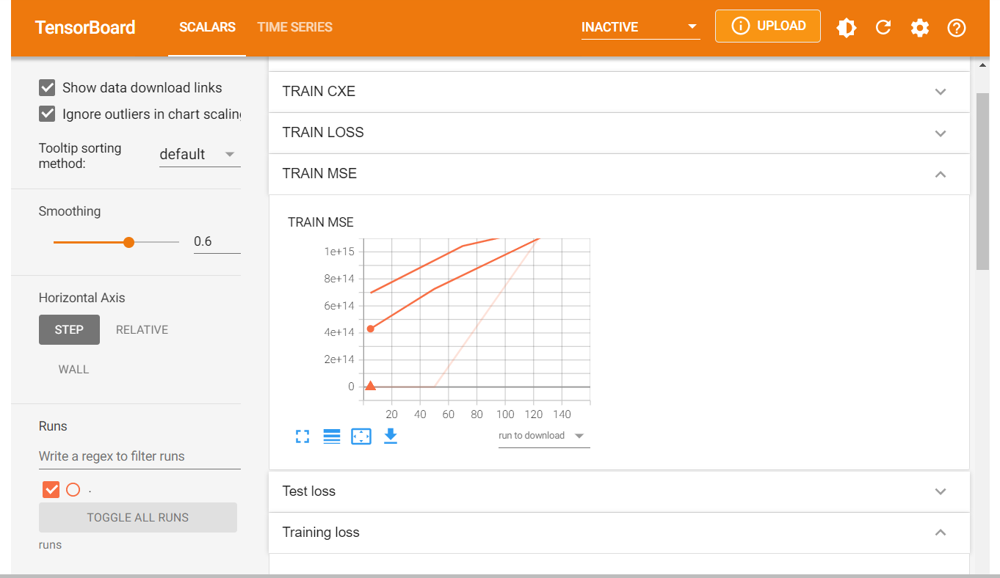

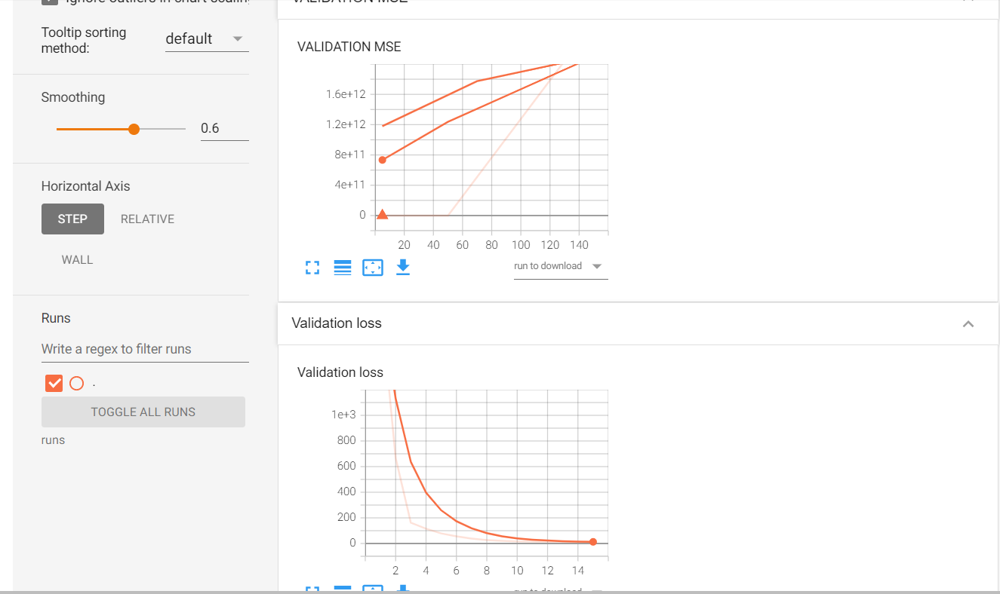

# Tensor Board Regression- MSE

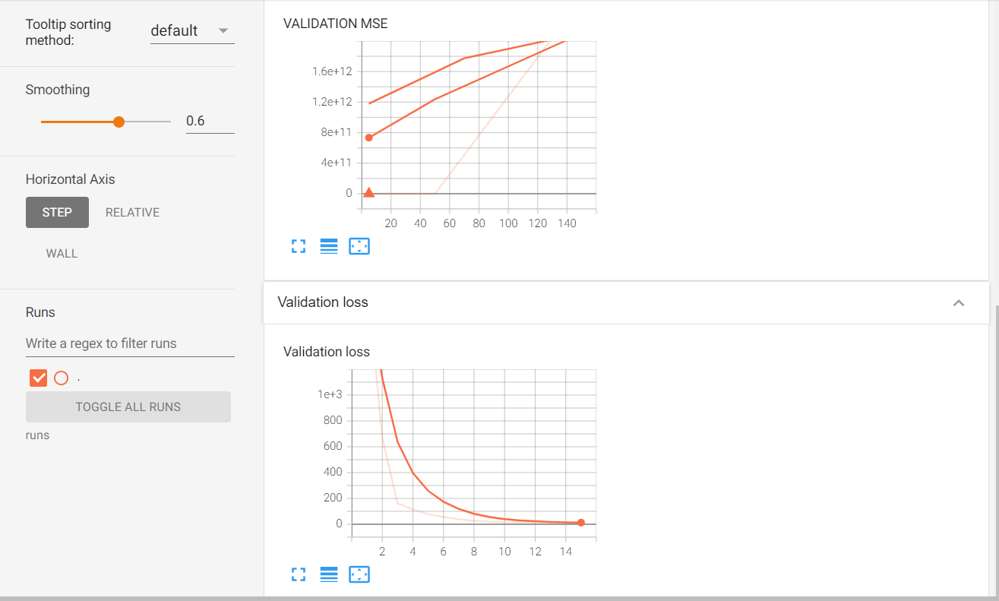

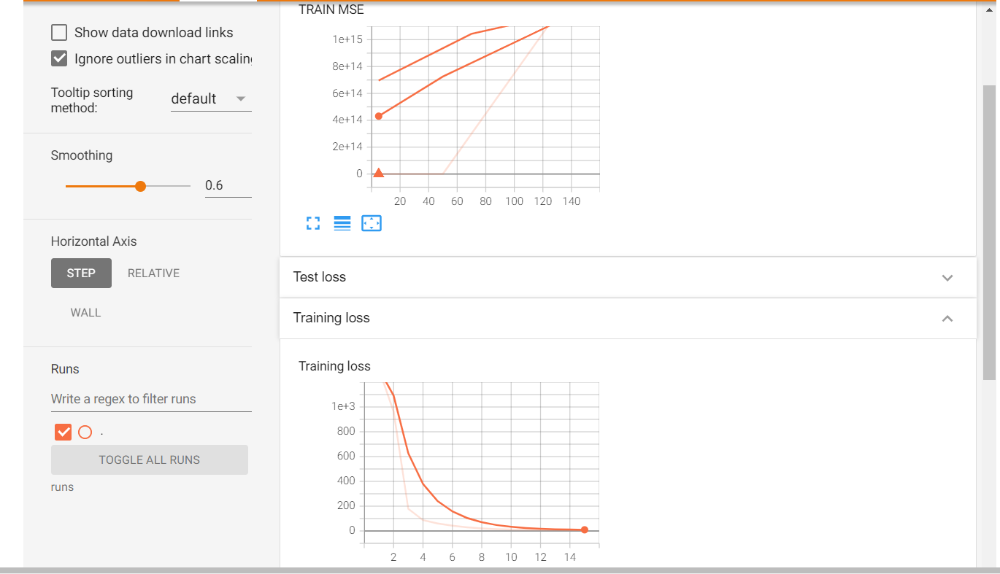

# Submission File Prep

For each SK_ID_CURR in the test set, you must predict a probability for the TARGET variable. The file should contain a header and have the following format:

```python 
SK_ID_CURR,TARGET
100001,0.1
100005,0.9
100013,0.2
etc.
```

In [85]:
def export_to_csv(arr):
    datasets['application_test']['Target'] = arr.tolist()
    final_df = datasets['application_test'][['SK_ID_CURR', 'Target']]
    final_df = final_df.reset_index(drop = True)
    final_df.to_csv('submission.csv', index = False)
export_to_csv(app_test_proba)

# Kaggle submission via the command line API

In [87]:
! kaggle competitions submit -c home-credit-default-risk -f submission.csv -m "baseline submission"

100%|███████████████████████████████████████| 1.26M/1.26M [00:01<00:00, 808kB/s]
Successfully submitted to Home Credit Default Risk

## report submission

Click on this [link](https://www.kaggle.com/c/home-credit-default-risk/submissions?sortBy=date&group=all&page=1)

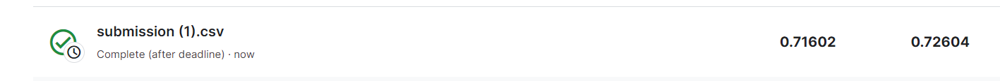

# Write-up 
For this phase of the project, you will need to submit a write-up summarizing the work you did. 
The write-up form is available on Canvas (Modules-> Module 12.1 - Course Project - Home Credit Default Risk (HCDR)-> FP Phase 2 (HCDR) : write-up form ). It has the following sections: 
## Abstract
Please provide an abstract summarizing the work you did (150 words)
## Introduction
## Feature Engineering and transformers
Please explain the work you conducted on feature engineering and transformers. 
Please include code sections when necessary as well as images or any relevant material
## Pipelines
Please explain the pipelines you created for this project and how you used them
Please include code sections when necessary as well as images or any relevant material
## Experimental results
Please present the results of the various experiments that you conducted. The results should be shown in a table or image. Try to include the different details for each experiment.  

Please include code sections when necessary as well as images or any relevant material
## Discussion
Discuss  & analyze your different experimental results  

Please include code sections when necessary as well as images or any relevant material
## Conclusion
## Kaggle Submission
Please provide a screenshot of your best kaggle submission.   
The screenshot should show the different details of the submission and not just the score.

# References

Some of the material in this notebook has been adopted from [here](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook)


#  TODO: Predicting Loan Repayment with Automated Feature Engineering in Featuretools

Read the following:
* feature engineering via Featuretools library: 
  * https://github.com/Featuretools/predict-loan-repayment/blob/master/Automated%20Loan%20Repayment.ipynb
* https://www.analyticsvidhya.com/blog/2018/08/guide-automated-feature-engineering-featuretools-python/
* feature engineering paper: https://dai.lids.mit.edu/wp-content/uploads/2017/10/DSAA_DSM_2015.pdf
* https://www.analyticsvidhya.com/blog/2017/08/catboost-automated-categorical-data/